In [3]:
import numpy as np
import matplotlib.pyplot as plt
import sklearn
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from scipy.stats import skew, kurtosis
import os
import random
import numpy as np
from predict import binarize
from mpl_toolkits.mplot3d import Axes3D
from scipy.signal import find_peaks
import pandas as pd
from scipy.fftpack import fft, fftfreq
from scipy.signal import peak_widths, peak_prominences
from scipy.io import loadmat
import seaborn as sns
from scipy.signal import spectrogram

## Dataframe of all signals

##### According to the documents on Z24 only R1V, R2L, R2T, R2V, R3V are present in every setup. Other sensors are moved around during every setup making them difficult to use as reliable channels

In [2]:
def get_avt_files(root):
    folder_path = root
    file_list = os.listdir(folder_path)
    avt_files = []

    # walk inside data folder
    for filename in file_list:
        full_path = os.path.join(folder_path, filename)
        cur_label = int(filename)

        # walk inside data/[number]
        file_nest_list = os.listdir(full_path)
        for filename_1 in file_nest_list:
            if filename_1 != "avt":
                continue
            else:
                # full_path_2 is of the form C:\Users\amroa\Documents\thesis\data\01\avt
                full_path_2 = os.path.join(full_path, filename_1)
                setup_filenames = [filename for filename in os.listdir(full_path_2) if "setup" in filename]
                for avt_file in setup_filenames:
                    full_path_3 = os.path.join(full_path_2, avt_file) # full_path_3 is of the form C:\Users\amroa\Documents\thesis\data\01\avt\01setup09.mat
                    avt = loadmat(full_path_3)
                    avt_files.append(avt)
    return avt_files

In [3]:
def get_dataframes(avt_files):
    """
    This method returns a list of dataframes # type: ignore
    A dataframe is of the form: # type: ignore
    R1V R2L ... R3V  (column names)
    0.1 0.3 ... 0.12
    0.4 0.1 ... 0.22 
    """
    good_sensors = ['R1V ', 'R2L ', 'R2T ', 'R2V ', 'R3V ']
    result = pd.DataFrame(columns=good_sensors)
    list_df = [] # should contain 17 entries, one for each damage state 

    # get pandas dataframes
    for idx, avt in enumerate(avt_files):
        # get index of the good sensor/positions
        arr_sensors = avt['labelshulp']
        bool_array = np.isin(arr_sensors, good_sensors) #  will contain True if entry corresponds to a good sensor
        indices_good_sensors = np.where(bool_array)[0]

        # Create a Pandas DataFrame
        df = pd.DataFrame(data=avt['data'][:, indices_good_sensors], columns=arr_sensors[indices_good_sensors])
        result = pd.concat([result, df], ignore_index=True)

        if (idx+1) % 9 == 0:
            # Most of the dataframes are 589824 except for 4 of them
            # Mirror the top part to the bottom to achive the same length
            top_rows = result.head(589824 - len(result))

            # Concatenate the sliced rows to the bottom of the original DataFrame
            new_res = pd.concat([result, top_rows], ignore_index=True)

            list_df.append(new_res)
            result = pd.DataFrame(columns=good_sensors)

    return list_df

In [4]:
avt_files = get_avt_files("C:\\Users\\amroa\\Documents\\thesis\\data")
dfs = get_dataframes(avt_files)

In [240]:
dfs[2]['R1V ']

0        -6.066895e-05
1        -2.200317e-05
2         4.150391e-06
3         4.107666e-05
4         8.563232e-05
              ...     
589819   -3.051758e-08
589820   -3.051758e-08
589821    1.983643e-06
589822   -4.852295e-06
589823   -4.211426e-06
Name: R1V , Length: 589824, dtype: float64

In [5]:
from preprocess import preprocess, preprocess_without_std
# Function takes as input window size (16384), the dataframes containing the data, test_split is 1 and window_size is 16384 means 1 out of (589,824/16,384) of the data is used for testing
def get_train_test(dataframes, standardize = True, test_split = 4, window_size = 16384):

    preprocess_function = (lambda x : preprocess(x)) if standardize else (lambda x : preprocess_without_std(x))
    labels_train = np.array([])
    labels_test = np.array([])
    train_data = []
    test_data = []

    for idx, df in enumerate(dataframes):
        random.seed(idx)
        nbr_splits = int(len(df)//window_size)  # test_split of these will be used for testing. len(df) = 589,824. nbr_splits = 36
        test_indices = random.sample(range(nbr_splits), test_split)
        train_indices = [x for x in range(nbr_splits) if x not in test_indices]
        for i in train_indices:
            labels_train = np.append(labels_train, idx)
            train_data_i = df.iloc[i*window_size: (i+1)*window_size].values
            data_i = np.apply_along_axis(preprocess_function, axis = 0, arr= train_data_i)
            train_data.append(data_i)
        for i in test_indices:
            labels_test = np.append(labels_test, idx)
            test_data_i = df.iloc[i*window_size: (i+1)*window_size].values
            data_i = np.apply_along_axis(preprocess_function, axis= 0, arr= test_data_i)
            test_data.append(data_i)

    return np.array(train_data), labels_train, np.array(test_data), labels_test 


In [13]:
train_data, labels_train, test_data, labels_test = get_train_test(dfs, standardize=False)

In [14]:
test_data.shape, train_data.shape, labels_train.shape

((68, 16384, 5), (544, 16384, 5), (544,))

## Spectrogram

We take the average spectrogram of each damage class

In [21]:
def plot_spectrogram(signals, title):
    fs = 100  # 100 samples/second
    T = 1.0 / fs  # time between consecutive samples
    t = np.arange(0, len(signals[0])/fs, T)  # time vector

    n_rows = 4  
    n_cols = 5  
    fig = plt.figure(figsize=(15, 15))
    fig.suptitle(title, fontsize=20, y = 1.01)  # Title for the entire plot

    # iterate through the signals
    for i in range(len(signals)):
        
        # the i'th preprocessed signal 
        y = signals[i]
        
        # calculate the spectrogram
        f, t_spec, Sxx = spectrogram(y, fs)
        
        # select subplot
        plt.subplot(n_rows, n_cols, i+1)
        plt.pcolormesh(t_spec, f, 10*np.log10(Sxx), shading = 'gouraud')
        plt.ylabel('Freq [Hz]')
        plt.xlabel('Time [s]')
        plt.title(f'State {i+1}')
        plt.colorbar(label='dB', orientation='horizontal', pad=0.2)

    # put spacing between subplots
    plt.tight_layout()
    # adjust subplots so they don't overlap with the main title
    plt.subplots_adjust(top= 0.95)
    plt.show()

In [31]:
from scipy import signal
def plot_morlet(signals, title):
    fs = 100  # 100 samples/second
    T = 1.0 / fs  # time between consecutive samples
    t = np.arange(0, len(signals[0])/fs, T)  # time vector

    n_rows = 4  
    n_cols = 5  
    fig = plt.figure(figsize=(15, 15))
    fig.suptitle(title, fontsize=20, y = 1.01)  # Title for the entire plot

    # iterate through the signals
    for i in range(len(signals)):
        
        # the i'th preprocessed signal 
        #y = signals[i]
        
        # calculate the spectrogram
        #f, t_spec, Sxx = spectrogram(y, fs)
        t = np.arange(0, len(signals[0][:16384])/fs, T)  # time vector (we had to shorten this a bit to prevent memory error)
        fs = 100
        w = 3
        sig = (signals[i])[:16384]
        freq = np.linspace(0.01, fs/2, 100)
        widths = w*fs / (2*freq*np.pi)
        cwtm = signal.cwt(sig, signal.morlet2, widths = widths)
        
        # select subplot
        plt.subplot(n_rows, n_cols, i+1)
        img = plt.pcolormesh(t, freq, 10*np.log10(np.abs(cwtm)), cmap='viridis', shading='gouraud')
        plt.ylabel('Freq [Hz]')
        plt.xlabel('Time [s]')
        plt.title(f'State {i+1}')
        plt.colorbar(label='dB', orientation='horizontal', pad=0.2)

    # put spacing between subplots
    plt.tight_layout()
    # adjust subplots so they don't overlap with the main title
    plt.subplots_adjust(top= 0.95)
    plt.show()

In [7]:
# Apply preprocess column wise
dfs_preprocessed = [df.apply(preprocess, axis=0) for df in dfs] 

In [8]:
# take only signals from R3V to plot their spectrogram
r3v_signals = [df.iloc[:, -1].values for df in dfs_preprocessed]

# take signals from R2V
r2v_signals = [df.iloc[:, 3].values for df in dfs_preprocessed]

# take signals from R2T
r2t_signals = [df.iloc[:, 2].values for df in dfs_preprocessed]

# take signals from R2L
r2L_signals = [df.iloc[:, 1].values for df in dfs_preprocessed]

# take signals from R1V
r1v_signals = [df.iloc[:, 0].values for df in dfs_preprocessed]

In [36]:
print(len(r2v_signals[0]))

589824


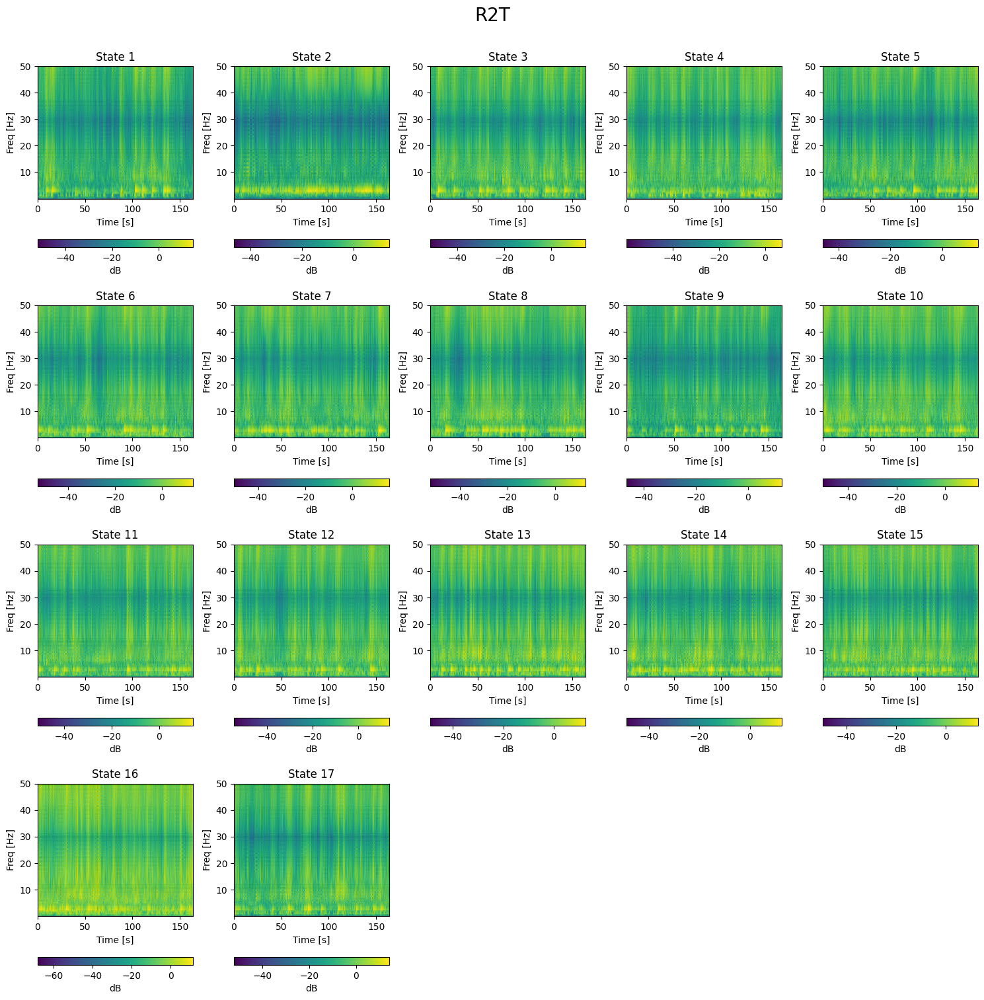

In [32]:
plot_morlet(r2t_signals, "R2T")

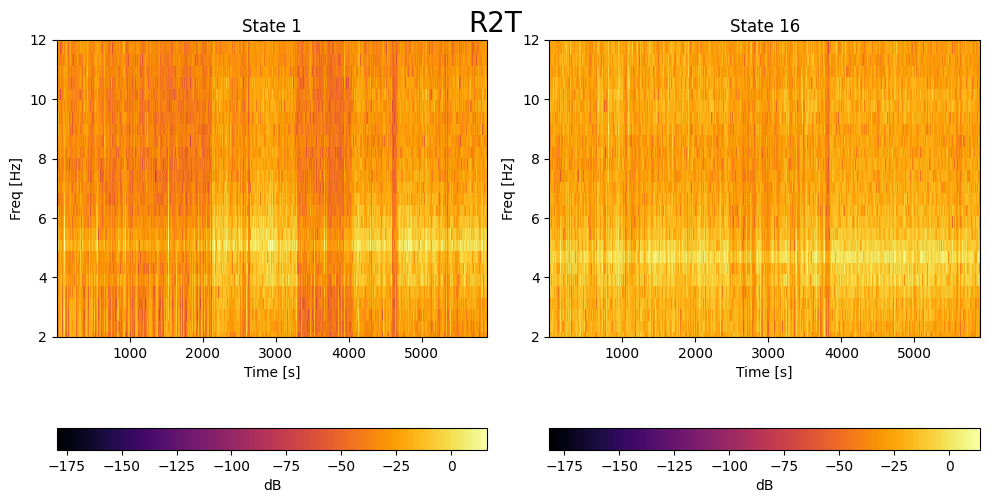

In [177]:
plot_spectrogram(r2t_signals, "R2T")

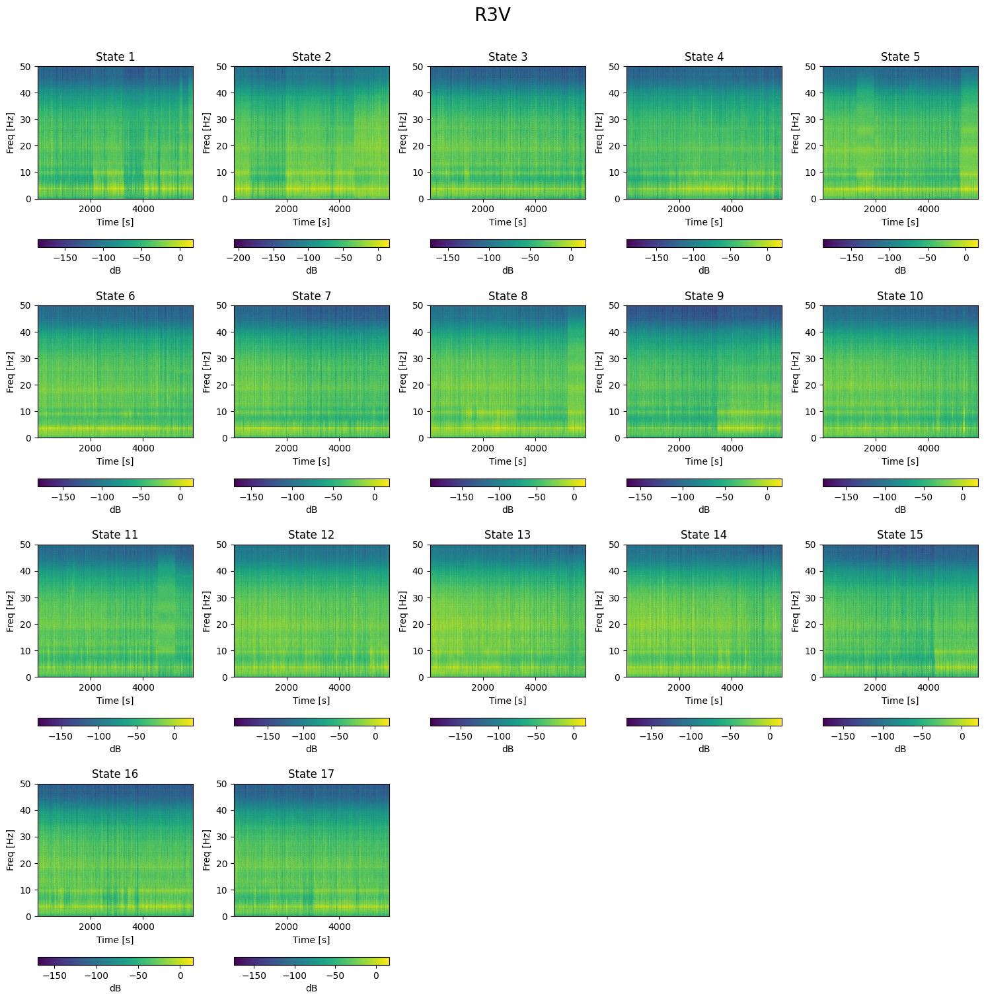

In [22]:
plot_spectrogram(r3v_signals, "R3V")

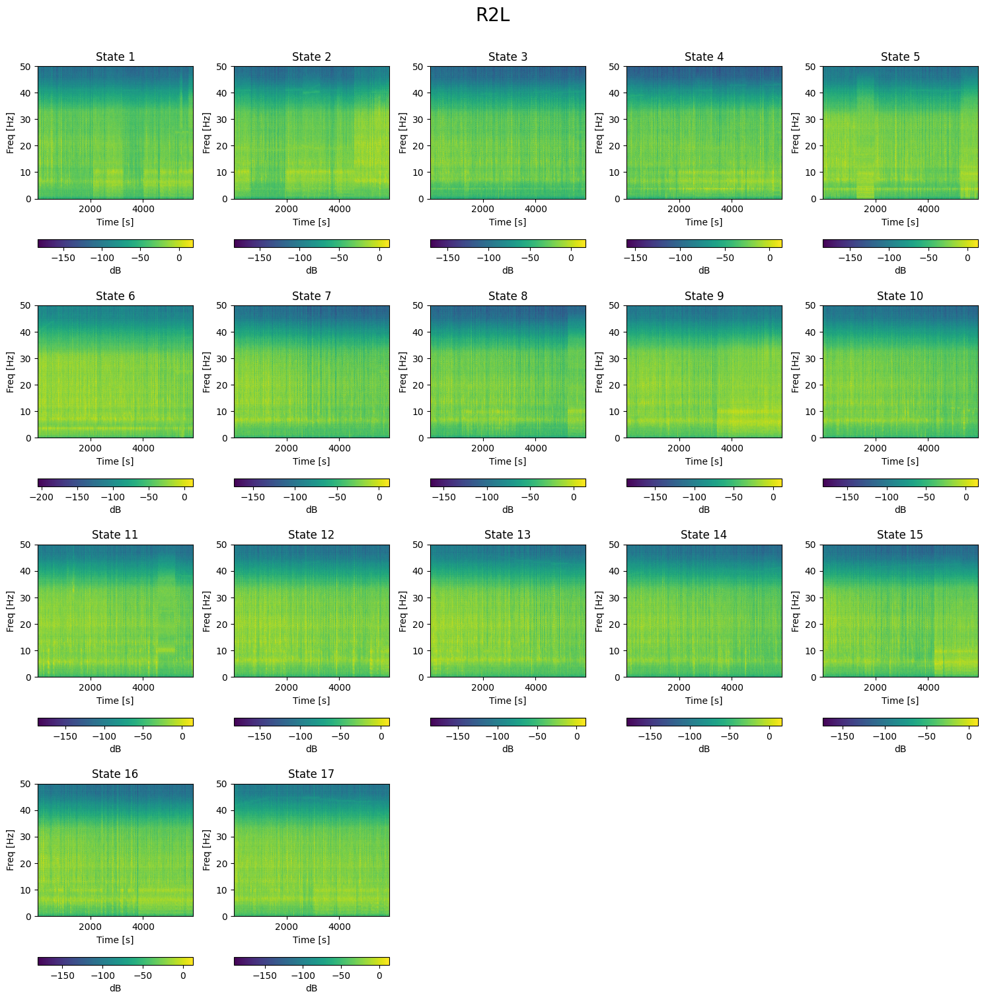

In [56]:
plot_spectrogram(r2L_signals, "R2L")

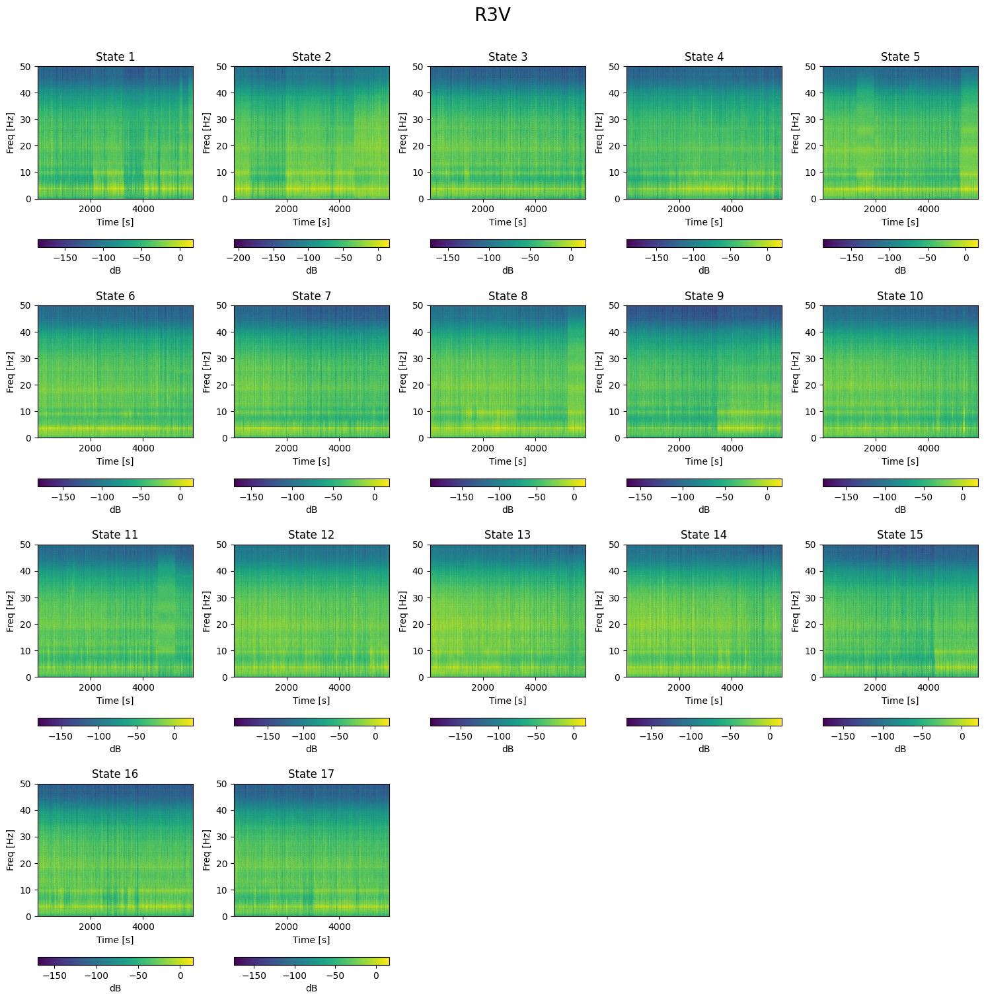

In [122]:
plot_spectrogram(r3v_signals, "R3V")

## ⚡ Fast Fourier Transform 

In [16]:
list_sensor_directions = dfs_preprocessed[0].columns.tolist()
list_sensor_directions

['R1V ', 'R2L ', 'R2T ', 'R2V ', 'R3V ']

In [251]:
from scipy.fftpack import fft, fftfreq

def plot_fft(dfs_preprocessed):

    fs = 100 #  the sample rate
    title = "Fast Fourier Transform"

    fig, axes = plt.subplots(5, 1, figsize=(10, 6*5))
    fig.suptitle(title, fontsize=20, y = 1.006)

    # Loop through the subplots
    for idx, ax in enumerate(axes):
        
        # The order is R1V, R2L, R2T, R2V, R3V
        signals = [df.iloc[:, idx].values for df in dfs_preprocessed]

        # Plot 17 line plots on the current subplot
        for i in range(17):

            # this should be constant for all signals around ~500,000
            n = len(signals[i])
            freqs = np.fft.fftfreq(n, 1/fs)[:n//2]
            yf = fft(signals[i])

            # Amplitude Spectrum
            amplitude_spectrum = np.abs(yf)[:n//2]

            # cycle thru a colormap
            unique_color = plt.cm.jet(i / 17)
            
            sns.lineplot(x=freqs, y=(amplitude_spectrum - np.mean(amplitude_spectrum))/np.std(amplitude_spectrum), label=f'State {i+1}', color=unique_color, ax=ax,alpha =0.5)
            ax.set_xlabel('Frequency (Hz)')
            ax.set_ylabel('Amplitude')
            ax.set_title(f'Fourier Transform of DS Classes using {list_sensor_directions[idx]}')
            ax.legend(loc='upper right')

    plt.tight_layout()
    plt.show()

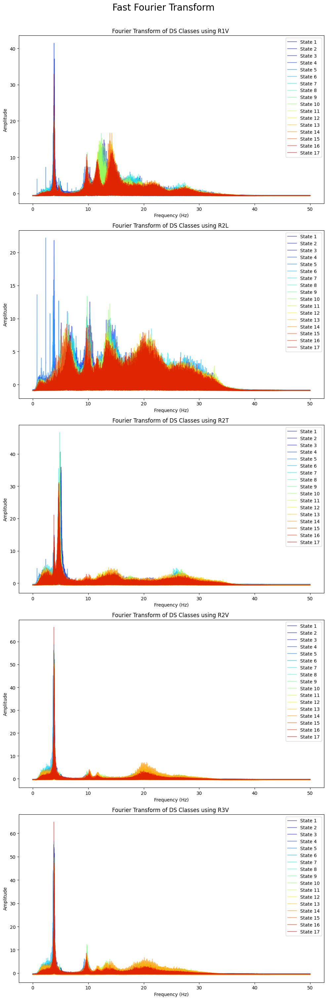

In [242]:
plot_fft(dfs_preprocessed)

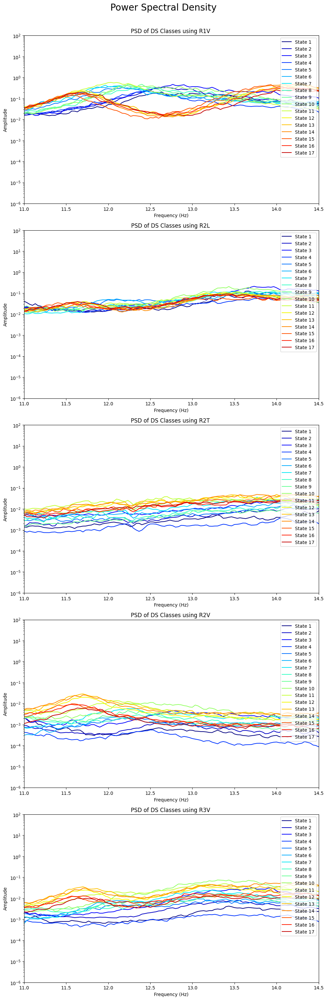

In [186]:
from scipy.signal import welch

def plot_pwelch(dfs_preprocessed):

    fs = 100 #  the sample rate
    title = "Power Spectral Density"

    fig, axes = plt.subplots(5, 1, figsize=(10, 6*5))
    fig.suptitle(title, fontsize=20, y = 1.006)

    # Loop through the subplots
    signals0 = [df.iloc[:, 0].values for df in dfs_preprocessed]
    for idx, ax in enumerate(axes):
        
        # The order is R1V, R2L, R2T, R2V, R3V
        signals = [df.iloc[:, idx].values for df in dfs_preprocessed]
        # signals = [signal[0:16384] for signal in signals] this was done to see how it would perform in the signal sample sizes we have in the training data

        # Plot 17 line plots on the current subplot
        for i in range(17):

            # This should be constant for all signals (around ~500,000)
            n = len(signals[i])

            freqs, amplitude_spectrum = welch(signals[i], fs,nperseg= 3000) # nperseg = 1000 for training to prevent noise with smaller sample sizes

            # cycle thru a colormap
            unique_color = plt.cm.jet(i / 17)
            
            sns.lineplot(x=freqs, y=(amplitude_spectrum), label=f'State {i+1}', color=unique_color, ax=ax)
            # sns.lineplot(x=freqs, y=(amplitude_spectrum)/(amplitude_spectrum0), label=f'State {i+1}', color=unique_color, ax=ax) # uncomment this for the transmissibility. For transmissibility also change set_xlim(2.5, 6) to set_xlim(1, 30)
            # sns.lineplot(x=freqs, y=(amplitude_spectrum), label=f'State {i+1}', color=unique_color, ax=ax)
            ax.set_xlabel('Frequency (Hz)')
            ax.set_ylabel('Amplitude')
            ax.set_title(f'PSD of DS Classes using {list_sensor_directions[idx]}')
            ax.legend(loc='upper right')
            ax.set_yscale("log") 
            ax.set_xlim(11, 14.5) # TODO: change to 2.5, 6 and take snapshot of R2T for the final report. Also do likewise for the transmissibility
            ax.set_ylim(10e-7,100)
            #print(len(freqs))# 1501 for nperseg of 3000

    plt.tight_layout()
    plt.show()
plot_pwelch(dfs_preprocessed)

C:\Users\amroa\AppData\Local\Temp\ipykernel_23996\1466391778.py:61: RankWarning: Polyfit may be poorly conditioned
  plot_pwelch(dfs_preprocessed)
c:\Users\amroa\AppData\Local\Programs\Python\Python311\Lib\site-packages\pandas\core\arraylike.py:396: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\amroa\AppData\Local\Programs\Python\Python311\Lib\site-packages\pandas\core\arraylike.py:396: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\amroa\AppData\Local\Programs\Python\Python311\Lib\site-packages\pandas\core\arraylike.py:396: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\amroa\AppData\Local\Programs\Python\Python311\Lib\site-packages\pandas\core\arraylike.py:396: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\amroa\AppData\Lo

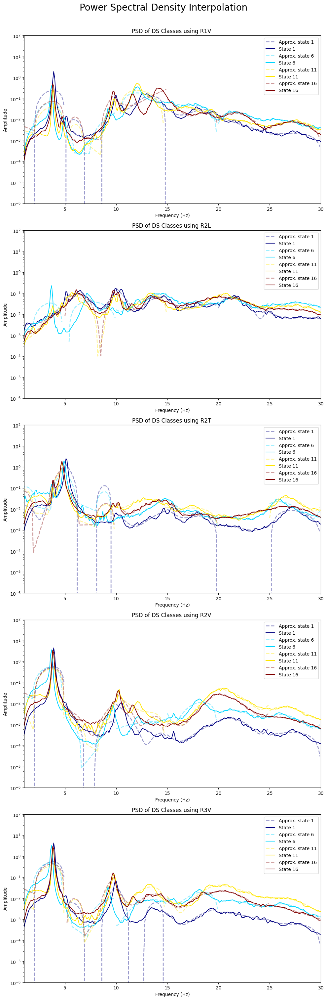

In [28]:
from scipy.signal import welch
from scipy.interpolate import UnivariateSpline
from scipy.interpolate import InterpolatedUnivariateSpline
def plot_pwelch(dfs_preprocessed):

    fs = 100 #  the sample rate
    title = "Power Spectral Density Interpolation"

    fig, axes = plt.subplots(5, 1, figsize=(10, 6*5))
    fig.suptitle(title, fontsize=20, y = 1.006)

    # Loop through the subplots
    signals0 = [df.iloc[:, 0].values for df in dfs_preprocessed]
    for idx, ax in enumerate(axes):
        
        # The order is R1V, R2L, R2T, R2V, R3V
        signals = [df.iloc[:, idx].values for df in dfs_preprocessed]
        # signals = [signal[0:16384] for signal in signals] this was done to see how it would perform in the signal sample sizes we have in the training data

        # Plot 17 line plots on the current subplot
        for i in [0, 5, 10, 15]:

            # this should be constant for all signals around ~500,000
            n = len(signals[i])
            freqs,amplitude_spectrum = welch(signals[i], fs,nperseg= 1000) # nperseg = 1000 for training to prevent noise with smaller sample sizes
            #freqs0,amplitude_spectrum0 = welch(signals0[i], fs,nperseg= 3000)
    
            # cycle thru a colormap
            unique_color = plt.cm.jet(i / 15)

            # find the best fit polynomial degree visually
            window = 50
            for spline_idx_start in range(0, len(freqs), window):
                spline_idx_end = spline_idx_start + window
                x_vals = freqs[spline_idx_start:spline_idx_end]
                y_vals = amplitude_spectrum[spline_idx_start:spline_idx_end]
                coefficients = np.polyfit(x_vals, y_vals, deg=3)
                polynomial = np.poly1d(coefficients)
                y_fitted = polynomial(freqs[spline_idx_start:spline_idx_end])
                if spline_idx_start == 0:
                    sns.lineplot(x=freqs[spline_idx_start : spline_idx_end], y=y_fitted, label = f'Approx. state {i+1}',linestyle='--', color=unique_color, alpha = 0.4, linewidth=2, ax = ax)
                else:
                    sns.lineplot(x=freqs[spline_idx_start : spline_idx_end], y=y_fitted, linestyle='--', color=unique_color, alpha = 0.4, linewidth=2, ax = ax)

            

            # Plot the actual PSD/Transmissibility
            #print(len(spl.get_knots()))
            sns.lineplot(x=freqs, y=amplitude_spectrum, label=f'State {i+1}', color=unique_color, ax=ax)
            ax.set_xlabel('Frequency (Hz)')
            ax.set_ylabel('Amplitude')
            ax.set_title(f'PSD of DS Classes using {list_sensor_directions[idx]}')
            ax.legend(loc='upper right')
            ax.set_yscale("log") 
            ax.set_xlim(1,30) # TODO: change to 2.5, 6 and take snapshot of R2T for the final report. Also do likewise for the transmissibility
            ax.set_ylim(10e-7,100)
            #print(len(freqs))# 1501 for nperseg of 3000

    plt.tight_layout()
    plt.show()
plot_pwelch(dfs_preprocessed)

## Feature Extraction

In [ ]:
from utils4 import get_features
fs = 100
test_features = [get_features(el, fs) for el in test_data]
print("test feature computation done")
train_features = [get_features(el, fs) for el in train_data]

In [175]:
test_features_np = np.array(test_features)
train_features_np = np.array(train_features)
test_features_np.shape, train_features_np.shape

((68, 5, 49), (544, 5, 49))

In [176]:
# Save the array for precomputation
np.save("train_shape_544_5_49.npy", train_features_np)
np.save("test_shape_68_5_49.npy", test_features_np)

In [23]:
def transmissibility(data):
    def psd(signal):
        from scipy.signal import welch
        fs = 100
        f, Pxx_den = welch(signal, fs,nperseg= 1000)
        return Pxx_den[0:300] # since beyond 30 Hz we have noise 
    return np.array([np.array([psd(el[:,i])/psd(el[:,0]) for i in range(1,data.shape[2])]).flatten() for el in data])

In [24]:
trans_train = transmissibility(train_data)
trans_test = transmissibility(test_data)
trans_train.shape, trans_test.shape # we have 5 channels, but one of them is used as a reference so we have 4 channels since the psd with nperseg = 1000 is 501 and we have 4 non-ref channels, then we get shape 501*4 = 2004

((544, 1200), (68, 1200))

In [19]:
def power_spectral_density(data):
    def psd(signal):
        from scipy.signal import welch
        fs = 100
        f, Pxx_den = welch(signal, fs,nperseg= 1000)
        #print(np.where(f >= 30)[0][0]) # 300
        return Pxx_den[0:300] # 300 is the index where frequency corresponds to 30 Hz
    return np.array([ np.array([  psd(el[:,i]) for i in range(data.shape[2]) ]).flatten() for el in data])

psd_train = power_spectral_density(train_data)
psd_test = power_spectral_density(test_data)
psd_train.shape, psd_test.shape

((544, 1500), (68, 1500))

In [20]:
def frequency_domain_features(signal): # signal is a row of psd_train or trans_train
    
    from tsfresh.feature_extraction import  feature_calculators as ftc
    from scipy.signal import find_peaks, peak_prominences
    from scipy.stats import skew, kurtosis

    def segment(arr, n):
        """
        Divides the array into n equal parts and returns two arrays:
        - An array with the maximum value in each part.
        - An array with the percentage denoting the relative position of the maximum value in its segment.
        """
        arr = np.array(arr)
        segment_length = len(arr) // n
        max_values = np.max(arr.reshape(-1, segment_length), axis=1)
        
        # Get the indices of the max values in their respective segments
        max_indices = np.argmax(arr.reshape(-1, segment_length), axis=1) + 1
        
        # Calculate relative positions as percentages
        relative_positions = (max_indices / segment_length) * 100

        return max_values, relative_positions

    def piecewise_regression(signal):
         # find the best fit polynomial degree visually
        window = 50
        coeff_array = []
        for idx, spline_idx_start in enumerate(range(0, 300, window)):
            spline_idx_end = spline_idx_start + window
            x_vals = np.linspace(idx*5, 4.9 + idx*5 , 50) # found by inspecting freqs 
            y_vals = signal[spline_idx_start:spline_idx_end]
            coefficients = np.polyfit(x_vals, y_vals, deg=3)
            coeff_array.append(coefficients)
        return np.array(coeff_array).flatten()
        
    # spectral centroid over part/window of the signal (there are four parts in the signal)
    def spectral_centroid(signal_window, freq_range):
        n = len(signal_window)
        return np.sum(freq_range * signal_window) / np.sum(signal_window) # frequencies weighted by their amplitude
    
    # spectral centroid window length
    window_size = len(signal)//4
    spectral_windows = range(0, len(signal), window_size) # (0, 75) (75, 150) (150, 225) (225, 300)
    spectral_centroids = [ spectral_centroid(signal[i:i + window_size], np.linspace(i*7.5, (i+1)*7.5, 75)) for i in spectral_windows] # 4 coefficients as there are 4 windows described in the line above

    # overall amplitude
    amp = np.mean(signal)

    nbr_peaks = ftc.number_peaks(signal, 25) # bigger than its 25 neighbors to the left and the right
    peaks, properties = find_peaks(signal, distance = 25) # not feature
    prominences = peak_prominences(signal, peaks)[0] # not a feature
    sorted_peak_indices = np.argsort(prominences)[-4:]

    sharpest_peaks_positions = peaks[sorted_peak_indices] # value of the signal at the sharpest 4 (most prominent) peaks
    sharpest_peak_heights = signal[sharpest_peaks_positions]

    # statistical characteristics of peak indices
    std_peaks = np.std(peaks)
    mean_peaks = np.mean(peaks)
    kur_peaks = kurtosis(peaks)
    skew_peaks = skew(peaks)

    heights = signal[peaks] # not a feature

    # we fit degree 5 b/c there were 4 main peaks observed in the signal. The frequency range is 1 to 30 Hz, however the length of the PSD is 300 (see cell with signature of power_spectral_..) 
    coeffs = piecewise_regression(signal) #np.polyfit(np.linspace(1, 30, 300), signal, 5)  

    mean_prom = np.mean(prominences)
    std_prom = np.std(prominences)
    mean_height = np.mean(heights)
    std_height = np.std(heights) 

    # segment the signal and find the maximum values in each segment along with the relative position of the maximum in the segment
    # we divide the [1,30] Hz window into intervals of size 2.5 Hz, which corresponds to windowlength 25 in the psd signal of size 300  (Note: 300/25 = 30/2.5 = 12)
    max_vals, rel_pos = segment(signal, 12)

    # 52 features
    return np.concatenate(([amp, nbr_peaks, std_peaks, mean_peaks, kur_peaks, skew_peaks, mean_prom, std_prom, mean_height, std_height], coeffs, sorted_peak_indices, sharpest_peaks_positions, sharpest_peak_heights, max_vals, rel_pos, spectral_centroids))


In [25]:
def psd_trans_properties(data):
    iterations = int(data.shape[1]/300) # should be 5 for both training and test (for psd)
    return np.hstack([np.apply_along_axis(frequency_domain_features, axis=1, arr=data[:, int(i*300) : int((i+1)*300) ]) for i in range(iterations)])

# get the properties of the PSD
train_psd_properties = psd_trans_properties(psd_train)
test_psd_properties = psd_trans_properties(psd_test)

# get the properties of the transmissibility
train_trans_properties = psd_trans_properties(trans_train)
test_trans_properties = psd_trans_properties(trans_test)

train_psd_properties.shape, test_psd_properties.shape, train_trans_properties.shape, test_trans_properties.shape

((544, 370), (68, 370), (544, 296), (68, 296))

In [27]:
train_features_np = np.load("train_shape_544_5_49.npy")
test_features_np  = np.load("test_shape_68_5_49.npy")

In [28]:
# the raw signal features flattened from (544, 5, 49) to (544, 245) for the sack of hstack with the PSD and transmissibility features
train_features_flat = np.array([el.flatten() for el in train_features_np])
test_features_flat = np.array([el.flatten() for el in test_features_np])

# first 245 are the (bandpass filtered, detrended) signal properties, the next 370 properties are those of the PSD, the last 296 are those of the transmissiblity. In summary [0:240] are signal props, [240:610] are PSD, and [610:906] are transmissibility
X_train_unprocessed = np.hstack((train_features_flat, train_psd_properties, train_trans_properties)) 
X_test_unprocessed = np.hstack((test_features_flat, test_psd_properties, test_trans_properties)) 

In [29]:
X_train_unprocessed.shape

(544, 911)

## Data preprocessing

In [32]:
def data_preprocessing(data, valid_columns = None, imputer = None, scaler = None): # for training data, default is None. For test, other parameters should be passed
    from sklearn.impute import SimpleImputer
    from sklearn.preprocessing import StandardScaler
    X_flattened_unstd = data
    X_valid_cols = []
    X_imputed = []
    X_std = []

    ## Remove columns with too many NANs
    if valid_columns is None:
        # Create a boolean mask for NaN values
        nan_mask = np.isnan(X_flattened_unstd)

        # Check for NaN values in each column and print the column indices with NaN values
        columns_with_nan = np.any(nan_mask, axis=0)
        nan_columns_indices = np.where(columns_with_nan)[0]

        nan_per_column = [np.sum(np.isnan(X_flattened_unstd[:, el])) if el in nan_columns_indices else 0 for el in range(X_flattened_unstd.shape[1])]
        valid_columns = np.array(nan_per_column) < (0.1*(X_flattened_unstd.shape[0])) # if more than 10 percent of a column is NaN, we ignore it 
        print(np.sum(valid_columns)) # we will sadly let go of 5 columns

        X_valid_cols = X_flattened_unstd[:, valid_columns]
    else:
        X_valid_cols = X_flattened_unstd[:, valid_columns]

    ## Impute missing values
    if imputer is None:
        imputer = SimpleImputer(strategy='mean')
        X_imputed = imputer.fit_transform(X_valid_cols)
    else:
        X_imputed = imputer.transform(X_valid_cols)

    ## Standardize the data
    if scaler is None:
        scaler = StandardScaler()
        X_std = scaler.fit_transform(X_imputed)
    else:
        X_std = scaler.transform(X_imputed)

    return X_std, valid_columns, imputer, scaler

In [33]:
X_train, valid_columns, imputer, scaler = data_preprocessing(X_train_unprocessed)
X_test, _, _, _ =                         data_preprocessing(X_test_unprocessed, valid_columns = valid_columns, imputer = imputer, scaler = scaler)
invalid_cols = set(np.arange(0, 875).astype(int)) - set(np.where(valid_columns)[0]) 
X_train.shape, X_test.shape, list(invalid_cols)

906


((544, 906), (68, 906), [66, 164, 17, 115, 213])

## PCA

In [52]:
def pca_plot(indices, title):
    from sklearn.decomposition import PCA
    pca = PCA(n_components=2, svd_solver = 'auto') 
    X_train_2D = pca.fit_transform(X_train[:, indices])
    print(X_train_2D.shape)

    # create figure and axes object
    fig, ax1 = plt.subplots(figsize=(10, 8))

    # scatter plot for PCA
    sc = ax1.scatter(X_train_2D[:, 0], X_train_2D[:, 1], c=labels_train, cmap='viridis')
    ax1.set_title(title)
    ax1.set_xlabel("Principal Component 0")
    ax1.set_ylabel("Principal Component 1")
    ax1.set_xlim(-5,5)
    ax1.set_ylim(-5,5)
    cbar = plt.colorbar(sc, ax=ax1)
    cbar.set_label('Labels')

    # display the plot
    plt.show()

(544, 2)


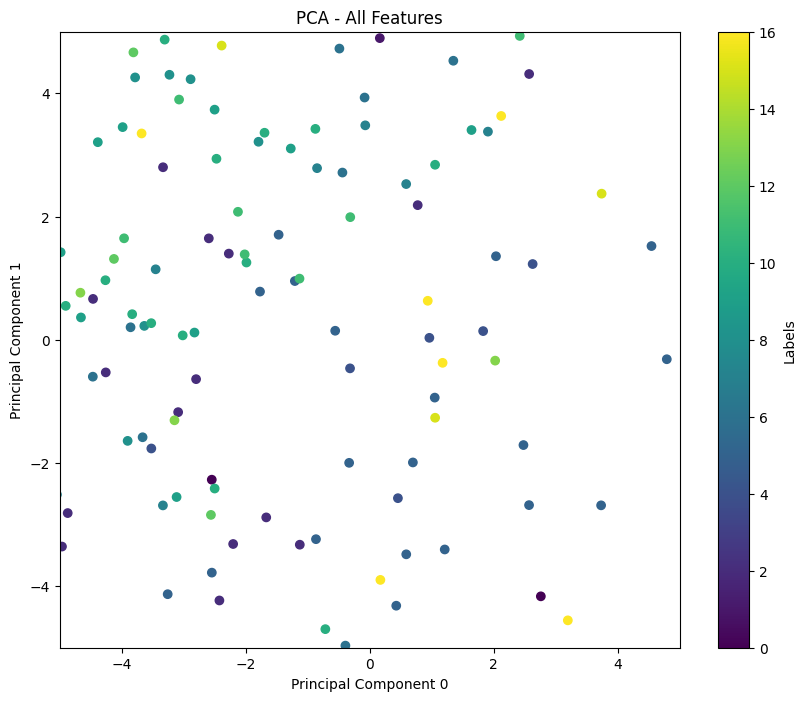

In [36]:
pca_plot(np.arange(X_train.shape[1]), "PCA - All Features")

(544, 2)


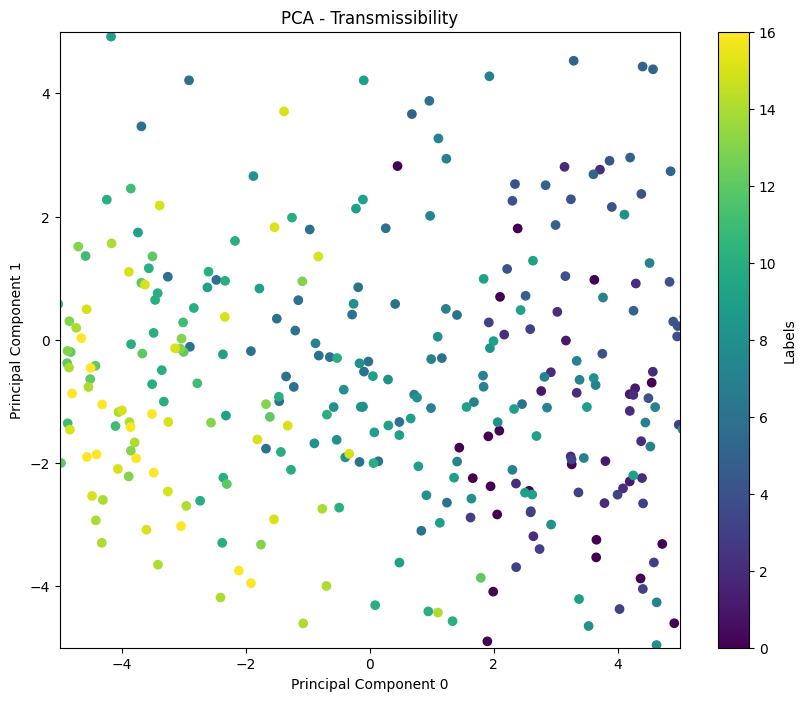

In [40]:
pca_plot(np.arange(610, X_train.shape[1]), "PCA - Transmissibility")

(544, 2)


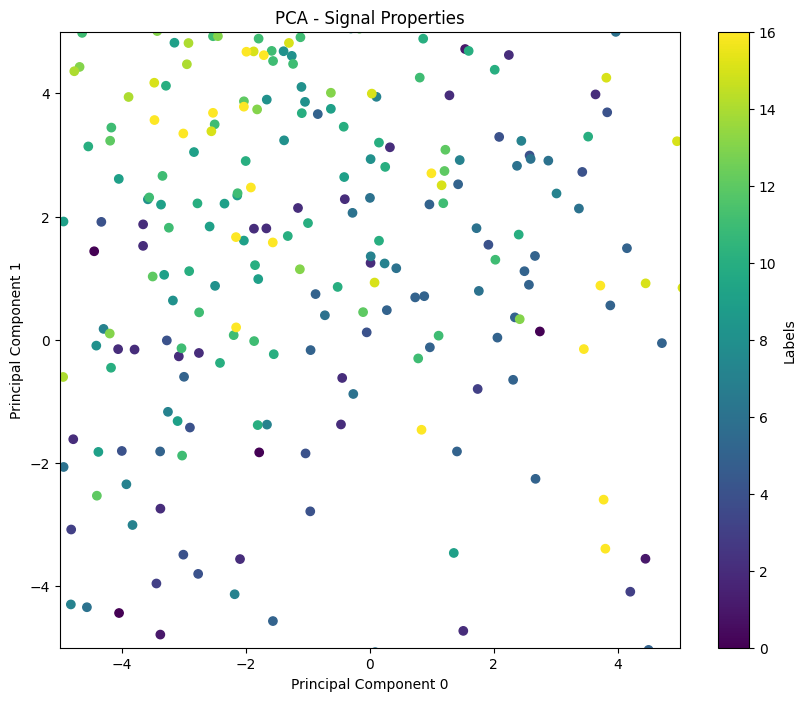

In [41]:
pca_plot(np.arange(0, 240), "PCA - Signal Properties")

(544, 2)


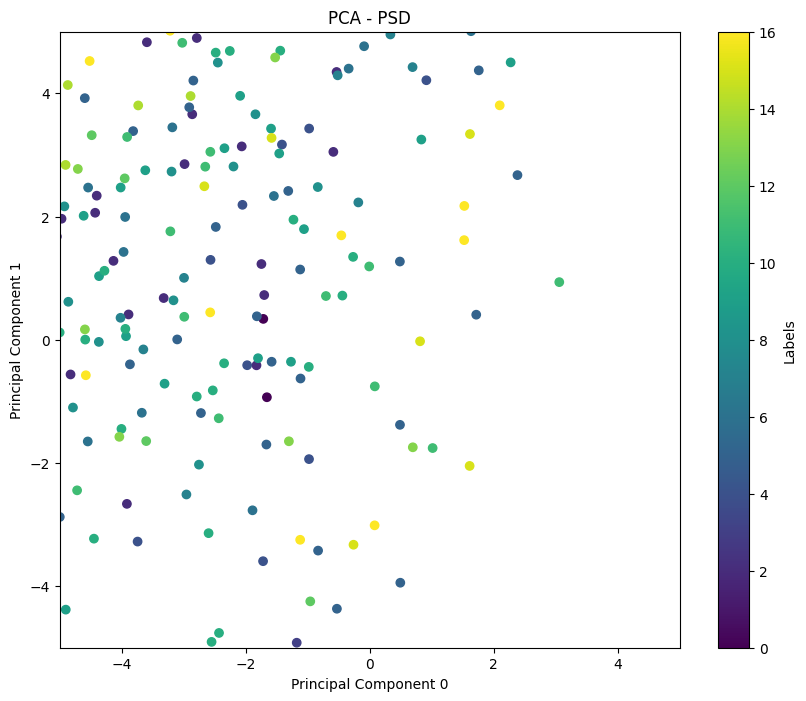

In [42]:
pca_plot(np.arange(240, 610), "PCA - PSD")

## t-SNE

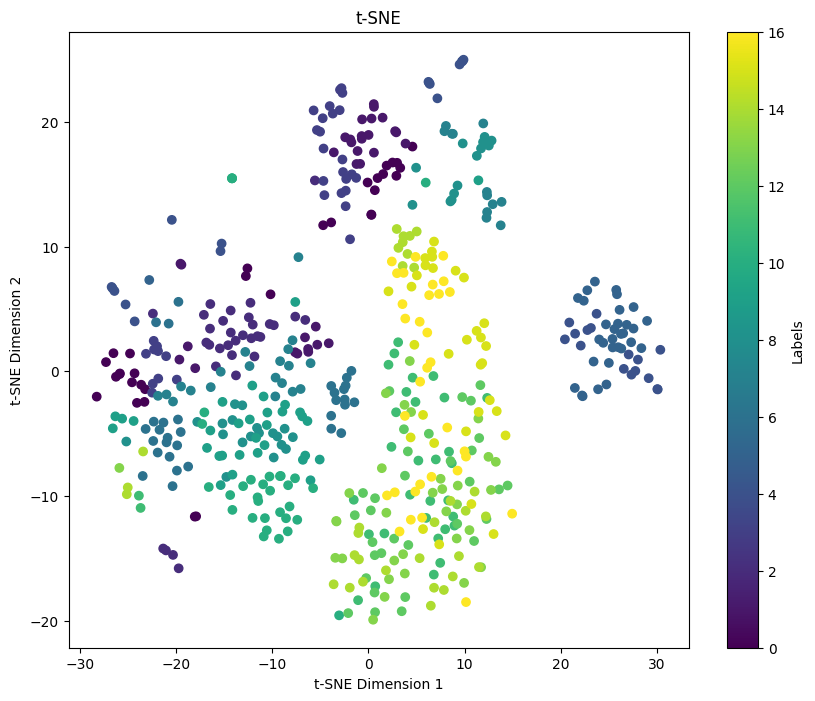

In [43]:
tsne = TSNE(n_components=2)
tsne_results = tsne.fit_transform(X_train)

# create figure and axes object
fig, ax1 = plt.subplots(figsize=(10, 8))

# scatter plot for PCA
sc = ax1.scatter(tsne_results[:, 0], tsne_results[:, 1], c=labels_train, cmap='viridis')
ax1.set_title("t-SNE")
ax1.set_xlabel("t-SNE Dimension 1")
ax1.set_ylabel("t-SNE Dimension 2")
cbar = plt.colorbar(sc, ax=ax1)
cbar.set_label('Labels')

# display the plot
plt.show()

In [292]:
# save all training and test data
np.save("X_test.npy", X_test)
np.save("X_train.npy", X_train)

np.save("labels_test.npy", labels_test)
np.save("labels_train.npy", labels_train)

In [10]:
import numpy as np
X_train = np.load("./../X_train.npy")
labels_train = np.load("./../labels_train.npy")

## Feature selection

In [1]:
def flatten(lst): # to flatten lists of lists
    result = []
    for item in lst:
        if isinstance(item, list):
            result.extend(flatten(item))
        else:
            result.append(item)
    return result

In [2]:
## get an array containing all the feature names. Size is 906
utils_time = ["d_mean", "d_median", "d_mode", "d_std", "d_var", "d_skew", "d_kurt", "d_cov", "d_zeros", "d_nans", "f_lsam", "f_lsbm", 
                         "f_n_peaks", "f_srv", "f_count0", "f_nu", "f_nu2", "f_ac_part", "f_bc", "f_c3", "f_cid_ce", "f_sl", "f_fulch", "f_rms", 
                         "f_abs_en", "f_abs_sc", "f_abs_mc", "f_mc", "f_m2d", "f_vlstd", "f_lstd", "f_rbs", "var_std_dist", "var_mta_dist", "var_lta_dist", 
                         "homog_sta_dist", "homog_mta_dist", "homog_lta_dist"] 
utils_acc = ["entr1", "entr2", "kurt_psd", "kurt_fft", "homog_psd", "homog_fft", "psd_range_95", "psd_range_50", 
                        "fft_range_95", "fft_range_50"] # length 48 for feature
utils = utils_time + utils_acc
# 48*5 channels = 240 features from this
psd_or_tran_features = ["amp", "nbr_peaks", "std_peaks", "mean_peaks", "kur_peaks", "skew_peaks", "mean_prom", "std_prom", "mean_height", "std_height", ["coeffs"]*24 , 
                ["sorted_peak_indices"]*4, ["sharpest_peaks_positions"]*4, ["sharpest_peak_heights"]*4, ["max_vals"]*12, ["rel_pos"]*12, 4*["spectral_centroids"]]
psd_or_tran_features = flatten(psd_or_tran_features)

(len(utils), len(utils_time), len(utils_acc), len(psd_or_tran_features)), (len(utils)*5 + 9*len(psd_or_tran_features))

((48, 38, 10, 74), 906)

In [3]:
feature_labels = utils*5 + psd_or_tran_features*9

In [11]:
# to plot feature importances using bar plot

def plot_ranking(sorted_feature_indices, feature_importances, feature_labels, top_k, model, size):
    import matplotlib.patches as mpatches

    # Ranges for the features
    acc_range       = np.array([np.arange(0, 38).astype('int') + i*48 for i in range(5)]).flatten() # acc from utils
    psd_range_utils = np.array([np.array([38, 39, 40, 42, 44, 45])+ i*48 for i in range(5)]).flatten() # psd from utils
    fft_range_utils = np.array([np.array([41, 43, 46, 47])        + i*48 for i in range(5)]).flatten() # fft from utils
    
    psd_range = np.arange(240, 610).astype('int') 
    trans_range = np.arange(610, 906).astype('int')

    # Select the top top k features
    top_indices = sorted_feature_indices[:top_k]
    top_importances = feature_importances[top_indices]
    top_labels = np.array(feature_labels)[top_indices]

    # Create a figure and axis
    fig, ax = plt.subplots(figsize=size) # [10, 20]

    # Create a bar plot with red for acceleration, blue for psd, and green for transmissibility
    colors = [(1, 0.8, 0.8) if i in acc_range else (0.8, 0.8, 1) if i in trans_range else (0.8, 1, 0.8) if i in fft_range_utils else (0.819, 0.58, 0.58) for i in top_indices]
    ax.barh(range(top_k), top_importances, align='center', color = colors)
    
    # Set the y-ticks to be the feature labels
    ax.set_yticks(range(top_k))
    ax.set_yticklabels(top_labels)

    # Invert the y-axis to have the most important feature at the top
    ax.legend()
    ax.invert_yaxis()

    legend_handles = [mpatches.Patch(color=(1, 0.8, 0.8), label='Acceleration'),
                      mpatches.Patch(color=(0.8, 0.8, 1), label='Transmittance'),
                      mpatches.Patch(color=(0.8, 1, 0.8), label='FFT'),
                       mpatches.Patch(color=(0.819, 0.58, 0.58), label='PSD') ]
    #ax.legend(handles=legend_handles)
    ax.legend(handles=legend_handles, bbox_to_anchor=(1.05, 1.0), loc='upper left')


    ax.set_xlabel('Feature Importance')
    ax.set_title(f'Top {top_k} Important Features for {model}')

    plt.show()

In [12]:
import plotly.graph_objects as go

def plot_sankey(sorted_feature_indices, feature_importances, feature_labels, top_k, name):
    sorted_feature_indices_topk = sorted_feature_indices[:top_k]

    # Divide the features into three groups
    group1_indices = [el for el in sorted_feature_indices_topk if el in range(240)] # size of utils4.py output
    group2_indices = [el for el in sorted_feature_indices_topk if el in range(240, 610)] 
    group3_indices = [el for el in sorted_feature_indices_topk if el in range(610, 906)]  #sorted_feature_indices[610:906]

    # Calculate the sum of feature importances for each group
    group1_value = feature_importances[group1_indices].sum()
    group2_value = feature_importances[group2_indices].sum()
    group3_value = feature_importances[group3_indices].sum()

    # Set up source, target, and value for the Sankey diagram
    source = [0, 1, 2]  # Three source nodes
    target = [3, 3, 3]  # A single target node for all sources
    value = [group1_value, group2_value, group3_value]

    # Create a labels list with labels for each source and the target node
    labels = ["Acceleration", "PSD", "Transmissibility", "Total Importance"]

    # Define the Sankey diagram data
    link = dict(source=source, target=target, value=value)
    node = dict(label=labels, pad=15, thickness=20)

    data = go.Sankey(link=link, node=node)

    # Create the figure and show it
    fig = go.Figure(data)
    # Save the figure as an image
    fig.write_image(f"{name}_sankey.png")
    #fig.show()

### XGBoost-based feature selection

### XGBoost - 17-class Classification

In [45]:
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split, GridSearchCV
import winsound

# Feature importances based on full training dataset

param_grid = {
            'learning_rate': [0.05, 0.1, 0.3, 1],
            'max_depth': [3, 5, 7, 10],
            'min_child_weight': [1, 3, 5],
            'gamma': [0.1, 0.4, 1, 1.5, 2, 3, 10],
            'subsample': [0.7, 0.8, 1],
            'colsample_bytree': [0.2, 0.4, 0.8]
        }

grid_search_xg_multi = GridSearchCV(XGBClassifier(), param_grid, cv=5, n_jobs=-1, scoring='accuracy')
grid_search_xg_multi.fit(X_train, labels_train)

print(f"For feature selection the score on full dataset is {grid_search_xg_multi.best_score_} and optimal params are {grid_search_xg_multi.best_params_}")

For feature selection the score on full dataset is 0.7958205912334353 and optimal params are {'colsample_bytree': 0.2, 'gamma': 0.1, 'learning_rate': 0.1, 'max_depth': 3, 'min_child_weight': 1, 'subsample': 1}


In [46]:
# Sort feature indices based on importance (using the optimal hyperparameters found in the last cell)
xgb_multi_model = XGBClassifier(learning_rate = 0.1, max_depth = 3, min_child_weight = 1, gamma = 0.1, subsample = 1, colsample_bytree = 0.2)
xgb_multi_model.fit(X_train, labels_train)
sorted_feature_indices = np.argsort(xgb_multi_model.feature_importances_)[::-1]

param_grid = {
            'learning_rate': [0.05, 0.1, 0.3, 1],
            'max_depth': [3, 5, 7, 10],
            'min_child_weight': [1, 3, 5],
            'gamma': [0.1, 0.4, 1, 1.5, 2, 3, 10],
            'subsample': [0.7, 0.8, 1],
            'colsample_bytree': [0.2, 0.4, 0.8]
        }

feature_count = [6, 10, 20, 40, 80, 160, 300]

scores_prog_xg_multi = []
for cnt in feature_count:
    # select first cnt indices
    subset_indices = sorted_feature_indices[:cnt]
    grid_search_xg_multi = GridSearchCV(XGBClassifier(), param_grid, cv=5, n_jobs=-1, scoring='accuracy')
    grid_search_xg_multi.fit(X_train[:, subset_indices], labels_train)

    # append current score to progression list
    scores_prog_xg_multi.append(grid_search_xg_multi.best_score_)
    print(f"For feature selection the score on {cnt} columns is {grid_search_xg_multi.best_score_} and optimal params are {grid_search_xg_multi.best_params_}")
winsound.Beep(1000, 5000) 

For feature selection the score on 6 columns is 0.45406048250084946 and optimal params are {'colsample_bytree': 0.8, 'gamma': 1.5, 'learning_rate': 0.05, 'max_depth': 10, 'min_child_weight': 3, 'subsample': 1}
For feature selection the score on 10 columns is 0.4576112810057764 and optimal params are {'colsample_bytree': 0.4, 'gamma': 1.5, 'learning_rate': 0.1, 'max_depth': 7, 'min_child_weight': 3, 'subsample': 1}
For feature selection the score on 20 columns is 0.6230037376826367 and optimal params are {'colsample_bytree': 0.4, 'gamma': 0.1, 'learning_rate': 0.3, 'max_depth': 5, 'min_child_weight': 1, 'subsample': 0.8}
For feature selection the score on 40 columns is 0.6928304451240231 and optimal params are {'colsample_bytree': 0.8, 'gamma': 0.1, 'learning_rate': 0.1, 'max_depth': 5, 'min_child_weight': 1, 'subsample': 0.7}
For feature selection the score on 80 columns is 0.7700985389058783 and optimal params are {'colsample_bytree': 0.4, 'gamma': 0.1, 'learning_rate': 0.1, 'max_dept

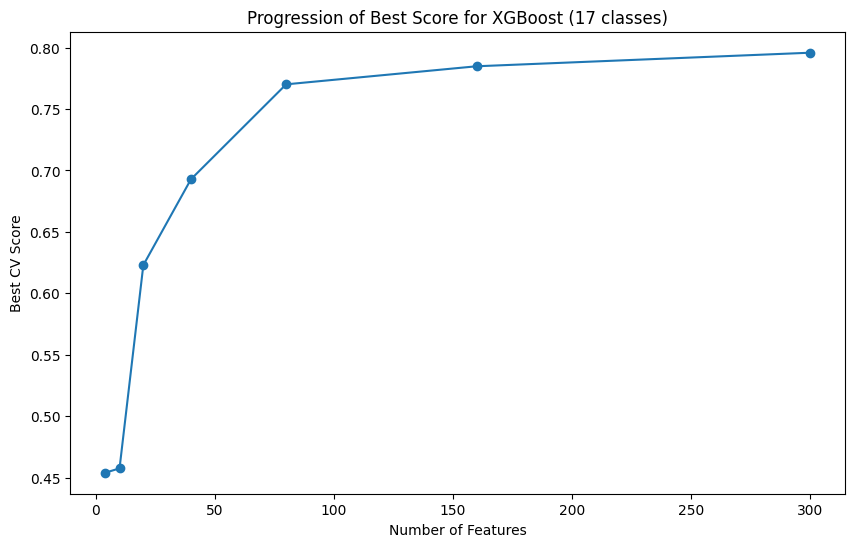

In [54]:
# Plotting
plt.figure(figsize=(10,6))
plt.plot(feature_count, scores_prog_xg_multi, '-o')
plt.xlabel('Number of Features')
plt.ylabel('Best CV Score')
plt.title('Progression of Best Score for XGBoost (17 classes)')
plt.show()

In [55]:
list(zip(feature_count, scores_prog_xg_multi)) # 200 features was tested separately, it gave an accuracy 0.8014441046551137 which is reasonably close to the accuracy produced by 150 features

[(4, 0.45406048250084946),
 (10, 0.4576112810057764),
 (20, 0.6230037376826367),
 (40, 0.6928304451240231),
 (80, 0.7700985389058783),
 (160, 0.7847944274549778),
 (300, 0.7958205912334353)]

In [932]:
sorted_feature_indices[0:300]

array([574, 607, 299, 396, 240, 254, 671, 301, 181, 150, 581, 440, 265,
       540, 391, 196, 493, 767, 363, 670, 536, 793, 520, 535, 538, 579,
       537, 324, 405, 605, 468, 334, 393, 509, 422, 264, 281,  94, 491,
       675, 653, 857, 806, 170, 470, 503, 410, 753, 561, 833, 321, 379,
       239, 577, 700, 437, 748, 775, 435, 680, 471, 660, 669, 257, 859,
       749, 439, 708, 677, 369, 751,  92, 421, 531, 284, 237,  74, 464,
       189, 395, 854, 666, 707,  90, 678, 418, 608, 864, 461, 303, 642,
       845, 723, 609, 672, 690, 860, 319, 258, 863, 676, 600, 781, 811,
       596, 263, 193, 847, 679, 323, 356, 366, 350, 288, 332, 365, 813,
         3, 261, 515, 327, 229, 637, 812, 119, 407, 513, 820, 638, 475,
       394, 674, 620, 133, 776, 712, 771, 250, 851, 270,  50, 190, 342,
       800, 610, 603, 777, 226, 841, 436, 750, 604, 846, 790, 589, 756,
        83, 197, 485, 702, 602, 429, 640, 808, 850, 664, 722, 130, 234,
       166, 717,   6, 718, 590, 784, 501, 724, 514, 357, 430,  5

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


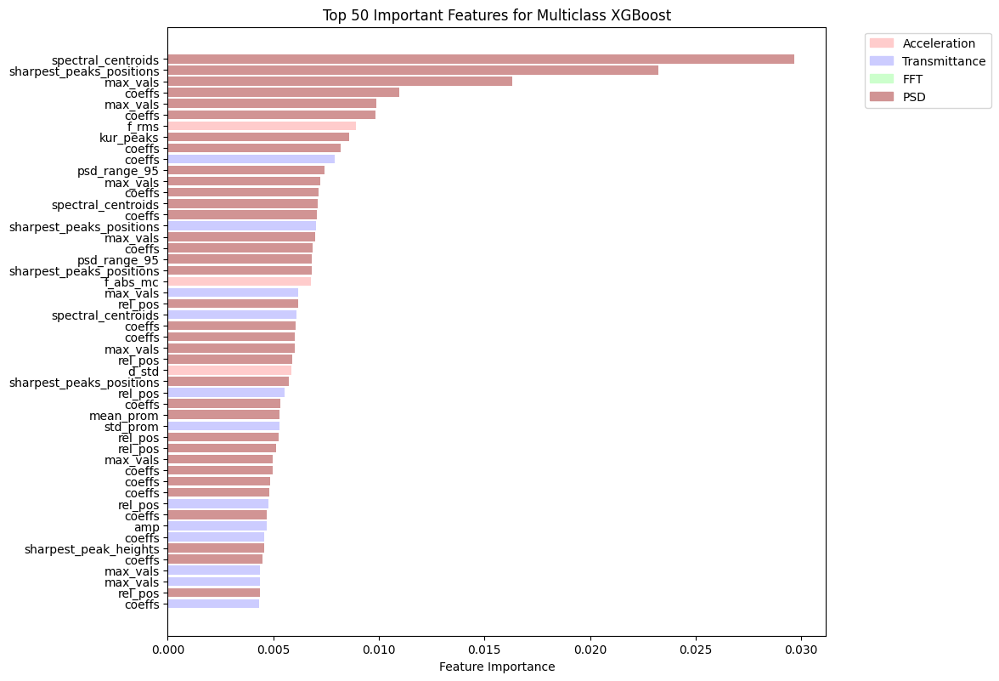

In [26]:
from xgboost import XGBClassifier
xgb_multi_model = XGBClassifier(learning_rate = 0.1, max_depth = 3, min_child_weight = 1, gamma = 0.1, subsample = 1, colsample_bytree = 0.2)
xgb_multi_model.fit(X_train, labels_train)
sorted_feature_indices = np.argsort(xgb_multi_model.feature_importances_)[::-1]
#plot_sankey(sorted_feature_indices, xgb_multi_model.feature_importances_, feature_labels, 80, "xgb_multi")
plot_ranking(sorted_feature_indices, xgb_multi_model.feature_importances_, feature_labels, 50, 'Multiclass XGBoost', [10, 9.3]) # 80 is where the elbow is located

In [11]:
plot_sankey(sorted_feature_indices, xgb_multi_model.feature_importances_, feature_labels, 80, "xgb_multi")

### XGBoost - Binary Classification

In [48]:
# this time we do binary classification
from predict import binarize
from sklearn.feature_selection import SelectKBest, mutual_info_classif, chi2, SelectPercentile, f_classif
from sklearn.tree import DecisionTreeClassifier
import winsound

param_grid = {
            'learning_rate': [0.05, 0.1, 0.3, 1],
            'max_depth': [3, 5, 7, 10],
            'min_child_weight': [1, 3, 5],
            'gamma': [0.1, 0.4, 1, 1.5, 2, 3, 10],
            'subsample': [0.7, 0.8, 1],
            'colsample_bytree': [0.2, 0.4, 0.8]
        }

y = binarize(labels_train)
grid_search_xg_bin = GridSearchCV(XGBClassifier(), param_grid, cv=5, n_jobs=-1, scoring='accuracy')
grid_search_xg_bin.fit(X_train, y)

print(f"For feature selection the score on full dataset is {grid_search_xg_bin.best_score_} and optimal params are {grid_search_xg_bin.best_params_}")
winsound.Beep(1000, 3000) 

For feature selection the score on full dataset is 0.9025484199796125 and optimal params are {'colsample_bytree': 0.4, 'gamma': 2, 'learning_rate': 1, 'max_depth': 3, 'min_child_weight': 1, 'subsample': 1}


In [53]:
# Sort feature indices based on importance (using the optimal hyperparameters found in the last cell)
xgb_bin_model = XGBClassifier(learning_rate = 1, max_depth = 3, min_child_weight = 1, gamma = 2, subsample = 1, colsample_bytree = 0.4)
xgb_bin_model.fit(X_train, binarize(labels_train))
sorted_feature_indices = np.argsort(xgb_bin_model.feature_importances_)[::-1]

# removed num_parallel_trees to optimize for time (boosting trees instead of RF)
param_grid = {
            'learning_rate': [0.05, 0.1, 0.3, 1],
            'max_depth': [3, 5, 7, 10],
            'min_child_weight': [1, 3, 5],
            'gamma': [0.1, 0.4, 1, 1.5, 2, 3, 10],
            'subsample': [0.7, 0.8, 1],
            'colsample_bytree': [0.3, 0.4, 0.5],
            'n_estimators': [70, 140, 250]
        }

feature_count = [4, 10, 20, 40, 80, 160, 300]

scores_prog_xg_bin = []
for cnt in feature_count:
    subset_indices = sorted_feature_indices[:cnt]
    grid_search_xg_bin = GridSearchCV(XGBClassifier(), param_grid, cv=5, n_jobs=-1, scoring='accuracy')
    grid_search_xg_bin.fit(X_train[:, subset_indices], y)

    # Append current score to progression list
    scores_prog_xg_bin.append(grid_search_xg_bin.best_score_)
    print(f"For feature selection the score on {cnt} columns is {grid_search_xg_bin.best_score_} and optimal params are {grid_search_xg_bin.best_params_}")
winsound.Beep(1000, 5000) 

For feature selection the score on 4 columns is 0.9485558953448863 and optimal params are {'colsample_bytree': 0.3, 'gamma': 1, 'learning_rate': 0.05, 'max_depth': 5, 'min_child_weight': 1, 'n_estimators': 70, 'subsample': 0.8}
For feature selection the score on 10 columns is 0.9283044512402311 and optimal params are {'colsample_bytree': 0.3, 'gamma': 0.1, 'learning_rate': 0.05, 'max_depth': 3, 'min_child_weight': 3, 'n_estimators': 250, 'subsample': 1}
For feature selection the score on 20 columns is 0.9466360856269114 and optimal params are {'colsample_bytree': 0.5, 'gamma': 0.4, 'learning_rate': 0.05, 'max_depth': 5, 'min_child_weight': 3, 'n_estimators': 250, 'subsample': 0.7}
For feature selection the score on 40 columns is 0.9300713557594292 and optimal params are {'colsample_bytree': 0.5, 'gamma': 1, 'learning_rate': 0.3, 'max_depth': 3, 'min_child_weight': 3, 'n_estimators': 70, 'subsample': 0.8}
For feature selection the score on 80 columns is 0.9227488956846756 and optimal pa

In [56]:
list(zip(feature_count, scores_prog_xg_bin))

[(4, 0.9485558953448863),
 (10, 0.9283044512402311),
 (20, 0.9466360856269114),
 (40, 0.9300713557594292),
 (80, 0.9227488956846756),
 (160, 0.9172103295956507),
 (300, 0.9041963982330955)]

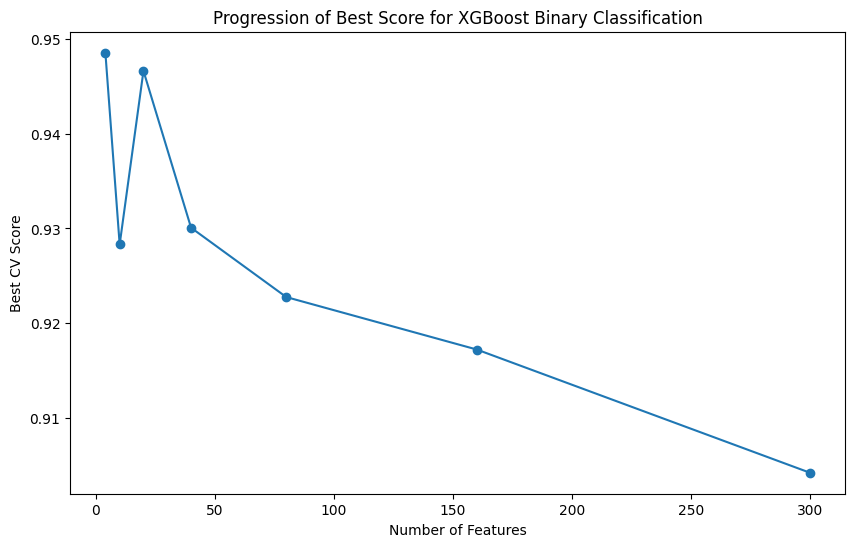

In [57]:
# Plotting
plt.figure(figsize=(10,6))
plt.plot(feature_count, scores_prog_xg_bin, '-o')
plt.xlabel('Number of Features')
plt.ylabel('Best CV Score')
plt.title('Progression of Best Score for XGBoost Binary Classification')
plt.show()

In [58]:
sorted_feature_indices[0:300]

array([673, 191, 374, 328, 732, 587, 883, 731, 821, 546, 303, 190, 805,
       811, 670, 485, 780, 429,  37, 684, 324, 415, 703, 291, 298, 297,
       296, 295, 325, 294, 293, 292, 290, 289, 288, 287, 286, 326, 327,
       285, 284, 283, 282, 299, 322, 323, 315, 314, 313, 316, 312, 311,
       310, 309, 308, 317, 307, 306, 318, 319, 304, 320, 321, 302, 301,
       300, 305, 905, 281, 239, 250, 249, 248, 247, 246, 245, 244, 243,
       242, 241, 240, 238, 252, 237, 236, 235, 234, 233, 232, 231, 230,
       229, 228, 227, 251, 253, 280, 267, 279, 278, 277, 276, 274, 273,
       272, 271, 270, 269, 268, 266, 254, 265, 264, 263, 262, 261, 260,
       259, 258, 257, 256, 255, 275, 334, 329, 387, 413, 412, 411, 410,
       409, 408, 407, 406, 405, 404, 403, 402, 401, 400, 399, 398, 397,
       396, 395, 394, 393, 392, 391, 390, 389, 414, 416, 417, 432, 443,
       442, 441, 440, 439, 438, 437, 436, 435, 434, 433, 431, 418, 430,
       428, 427, 426, 425, 424, 423, 422, 421, 420, 419, 388, 38

(544, 2)


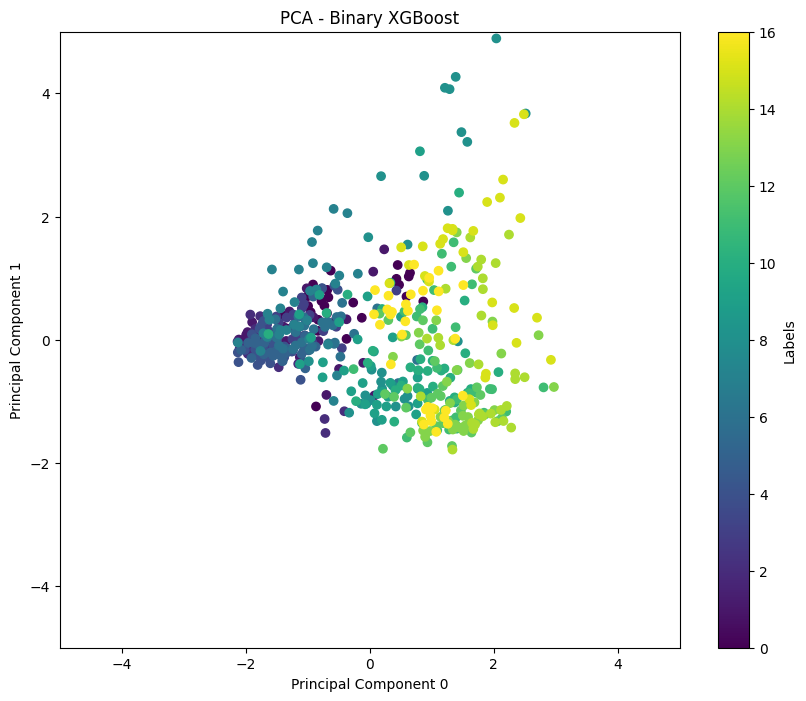

In [224]:
pca_plot(np.array([673, 191, 374, 328]), "PCA - Binary XGBoost")

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


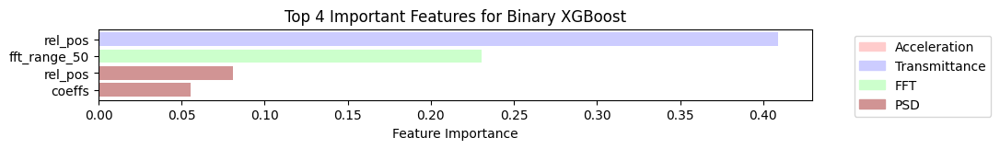

In [14]:
from xgboost import XGBClassifier
from predict import binarize
import matplotlib.pyplot as plt
xgb_bin_model = XGBClassifier(learning_rate = 1, max_depth = 3, min_child_weight = 1, gamma = 2, subsample = 1, colsample_bytree = 0.4)
xgb_bin_model.fit(X_train, binarize(labels_train))
sorted_feature_indices = np.argsort(xgb_bin_model.feature_importances_)[::-1]
plot_ranking(sorted_feature_indices, xgb_bin_model.feature_importances_, feature_labels, 4, 'Binary XGBoost', [10, 1]) # 80 is where the elbow is located

### SVC -  Binary Classification

In [ ]:
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from predict import binarize
# logistic regression depends on the statistical distribution of the data, rather than the geometry like SVC, making it a better candidate for feature importance rather than SVC
# C = 0.2 was determined experimentally below to be the optimal regularization coefficient
log_reg = LogisticRegression(C = 0.2) 
y = binarize(labels_train)
log_reg.fit(X_train, y)
sorted_feature_indices = np.argsort(log_reg.coef_[0])[::-1] # get the indices of the most important features in descending order

# find the accuracy using this number of features
feature_counts = [6, 10, 20, 30, 80, 160, 300]
scores_prog_svc_bin = []

for idx, feature_count in enumerate(feature_counts):

    subset_indices = sorted_feature_indices[:feature_count] # subset of columns to use from the training data

    # Hyperparameters to tune for SVC
    param_grid = {
        'C': [0.1, 0.5, 20, 100],
        'gamma': ['auto', 'scale'],
        'kernel': ['linear'] # linear due to the number of features
    }
    
    # List to store progression of scores
    grid_search = GridSearchCV(SVC(random_state = 20), param_grid, cv=5, n_jobs=-1, scoring='accuracy')
    grid_search.fit(X_train[:, subset_indices], y)
    scores_prog_svc_bin.append(grid_search.best_score_)
    print(f"For feature count {feature_count} and run {idx} the score is {grid_search.best_score_} and param is {grid_search.best_params_}")


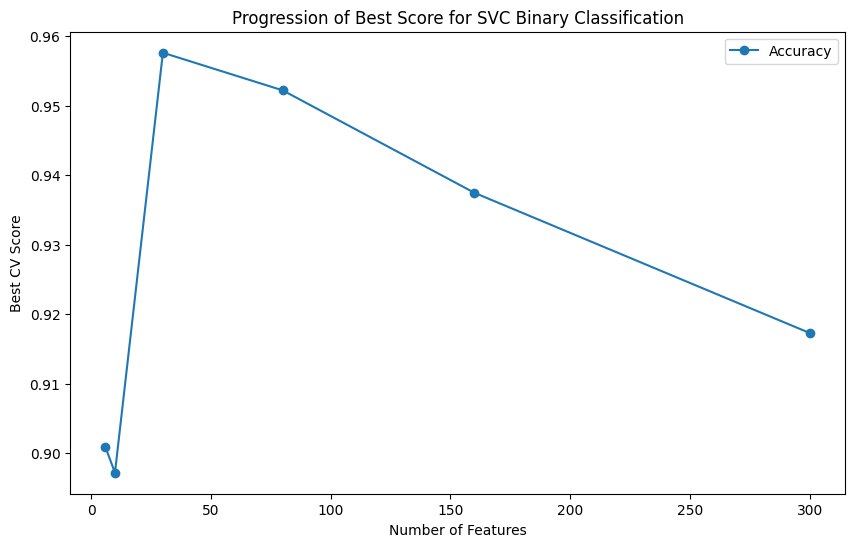

In [64]:
plt.figure(figsize=(10,6))
plt.plot(feature_counts, scores_prog_svc_bin, '-o', label='Accuracy')
#plt.fill_between(feature_counts, mean_scores - std_scores, mean_scores + std_scores, color='gray', alpha=0.2, label='1 Standard Deviation') # svc is deterministic
plt.xlabel('Number of Features')
plt.ylabel('Best CV Score')
plt.title('Progression of Best Score for SVC Binary Classification')
plt.legend()
plt.show()

In [65]:
list(zip(feature_counts, scores_prog_svc_bin))

[(6, 0.9008664627930683),
 (10, 0.8971627590893647),
 (30, 0.9576282704723071),
 (80, 0.9522086306489976),
 (160, 0.9374617737003058),
 (300, 0.9172612979952429)]

In [66]:
# The most important damage sensitive features
sorted_feature_indices[0:300]

array([191, 189, 239, 888, 303, 237, 608, 387, 812, 899, 811, 372, 886,
       780, 375, 885, 782, 700, 601, 373, 698,  60, 328, 875, 386, 734,
       883, 833, 404, 330, 402, 753, 744, 534, 256,  37, 254, 611, 289,
        95,  34, 346, 686, 344, 415, 379, 681,  93,  92, 417,  35,  36,
       713, 324,  19, 903, 666,  49,  32, 140, 711, 318, 151, 142, 645,
       820, 599, 809, 834, 687, 190, 449, 326, 527, 229, 884, 271,  33,
       273, 515, 868, 238, 484, 226, 876, 486, 398, 573, 672, 703, 438,
       437, 705, 571, 390, 677, 407, 258, 409, 220, 592, 867, 454, 425,
       642, 181, 654, 575,   1, 400, 236, 640, 310, 872, 871, 260, 837,
        94, 362, 188, 277, 639, 764, 281, 887, 649, 172, 343, 341, 829,
       352, 901, 178, 637, 524, 313, 244, 825, 149, 858, 389, 348, 283,
       818, 735, 284, 808, 312, 363, 629, 412,  22, 813, 457, 228, 198,
       376, 596, 802, 410, 860, 558, 827, 530, 306, 204, 150, 526, 274,
       316, 635, 123, 278, 560,  67, 852, 435, 633, 210, 499, 58

#### > The optimal number of features for binary SVC is 30 and binary XGBoost is 4 

(544, 2)


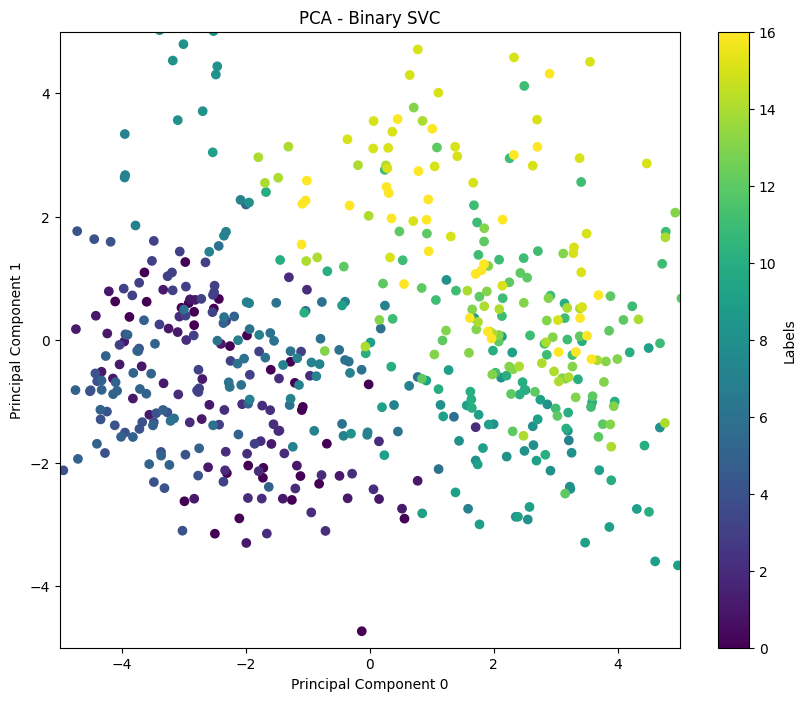

In [223]:
pca_plot(np.array([191, 189, 239, 888, 303, 237, 608, 387, 812, 899, 811, 372, 886, 780, 375, 885, 782, 700, 601, 373, 698, 60, 328, 875, 386, 734, 883, 833, 404, 330]), "PCA - Binary SVC")

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


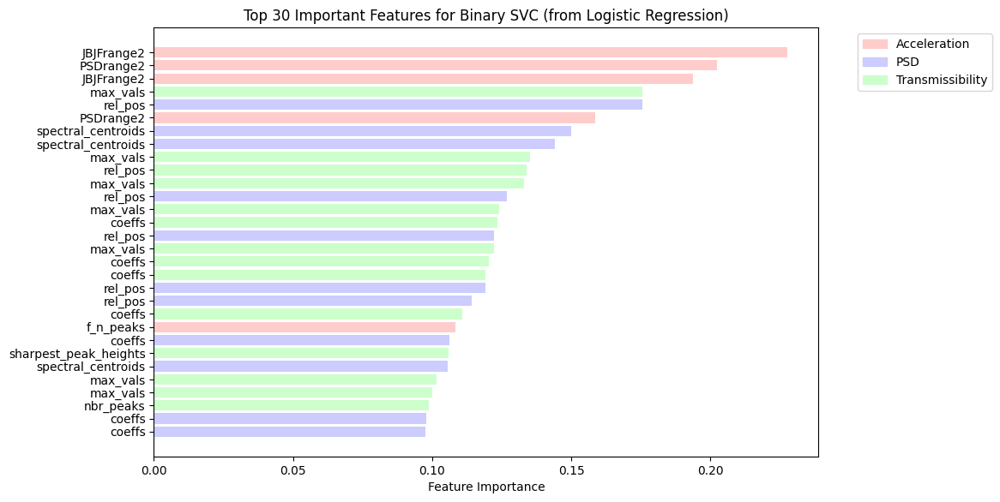

In [41]:
from sklearn.linear_model import LogisticRegression
log_reg = LogisticRegression(C = 0.2) 
y = binarize(labels_train)
log_reg.fit(X_train, y)
sorted_feature_indices = np.argsort(log_reg.coef_[0])[::-1]
plot_ranking(sorted_feature_indices, log_reg.coef_[0], feature_labels, 30, 'Binary SVC (from Logistic Regression)', [10, 6.5]) # 80 is where the elbow is located

### SVC - 17-class Classification

In [68]:
# for el in np.arange(0.1, 1.0, 0.1): # 0.2 was determined to be optimal. It was commented to avoid cluttering the notebook
log_reg = LogisticRegression(C = 0.2) # logistic regression depends on the statistical distribution of the data, rather than the geometry like SVC, making it a better candidate for feature importance rather than SVC
log_reg.fit(X_train, labels_train)
sorted_feature_indices = np.argsort(np.max(log_reg.coef_, axis = 0))[::-1] # get the indices of the most important features in descending order. np.max was found to have better predictive performance compared to np.mean and np.median and np.min

# find the accuracy using this number of features
feature_counts = [6, 10, 20, 40, 80, 160, 300]
scores_prog_svc_multi = []

for idx, feature_count in enumerate(feature_counts):

    subset_indices = sorted_feature_indices[:feature_count] # subset of columns to use from the training data

    # Hyperparameters to tune for SVC
    param_grid = {
        'C': [0.1, 0.5, 20, 100],
        'gamma': ['auto', 'scale'],
        'kernel': ['linear', 'rbf'] # linear due to the high number of features. Others were tested as well but did not achieve better accuracy
    }
    
    # List to store progression of scores
    grid_search = GridSearchCV(SVC(), param_grid, cv=5, n_jobs=-1, scoring='accuracy')
    grid_search.fit(X_train[:, subset_indices], labels_train)
    scores_prog_svc_multi.append(grid_search.best_score_)
    print(f"For feature count {feature_count} and run {idx} the score is {grid_search.best_score_} and param is {grid_search.best_params_}")

c:\Users\amroa\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


For feature count 6 and run 0 the score is 0.3841148487937479 and param is {'C': 20, 'gamma': 'scale', 'kernel': 'rbf'}
For feature count 10 and run 1 the score is 0.42996941896024465 and param is {'C': 0.5, 'gamma': 'auto', 'kernel': 'linear'}
For feature count 20 and run 2 the score is 0.5696568127760788 and param is {'C': 20, 'gamma': 'scale', 'kernel': 'rbf'}
For feature count 40 and run 3 the score is 0.6928644240570846 and param is {'C': 0.1, 'gamma': 'auto', 'kernel': 'linear'}
For feature count 80 and run 4 the score is 0.7681957186544343 and param is {'C': 20, 'gamma': 'auto', 'kernel': 'rbf'}
For feature count 160 and run 5 the score is 0.8105844376486578 and param is {'C': 0.1, 'gamma': 'auto', 'kernel': 'linear'}
For feature count 300 and run 6 the score is 0.8344206591913015 and param is {'C': 0.1, 'gamma': 'auto', 'kernel': 'linear'}


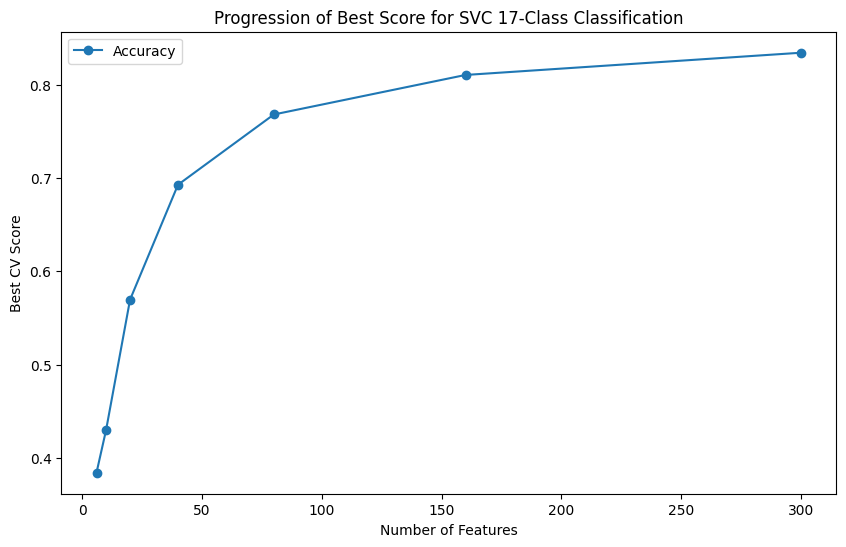

In [69]:
plt.figure(figsize=(10,6))
plt.plot(feature_counts, scores_prog_svc_multi, '-o', label='Accuracy')
plt.xlabel('Number of Features')
plt.ylabel('Best CV Score')
plt.title('Progression of Best Score for SVC 17-Class Classification') # the peak occurred at 200 with 83% accuracy, but for the sake of methodolody we will keep this graph wihtout a notch at 200 to remain consistent with the other graphs 
plt.legend()
plt.show()

In [70]:
list(zip(feature_counts, scores_prog_svc_multi))

[(6, 0.3841148487937479),
 (10, 0.42996941896024465),
 (20, 0.5696568127760788),
 (40, 0.6928644240570846),
 (80, 0.7681957186544343),
 (160, 0.8105844376486578),
 (300, 0.8344206591913015)]

In [71]:
# the most informative class-sensitive features (not damage sensitive features)
sorted_feature_indices[0:300]

array([448, 742, 193, 746, 731, 890, 757, 530, 748, 161, 741, 745, 241,
       461, 282,  37, 376, 443, 107, 384, 672, 669, 594, 460, 776, 654,
       699, 778, 665, 750, 732, 629, 633, 154, 635, 701, 630, 809, 825,
       303, 891, 670, 377, 245, 156, 882, 744, 738, 903, 682, 631, 737,
       667,  92, 883,  27, 389, 671,  34, 373, 531, 455, 799, 768, 260,
       795, 372, 375, 646, 300, 209, 191, 393, 628, 313, 600, 307, 244,
       820, 539, 143, 817, 306,   1, 312, 756,   7, 901, 437, 686, 816,
       374, 108, 261, 392, 596, 735, 703, 369, 137, 124, 139, 276, 259,
       453, 220, 852, 446, 650, 524, 588, 894, 705, 258, 704, 728, 884,
       835, 819, 354,  95, 888, 850, 380, 202, 318, 242, 827, 853, 457,
       736, 302, 315, 662, 685, 316, 611, 286, 688, 702, 357, 753, 899,
       851, 383, 613, 348, 365, 505, 677, 771, 810, 829, 661, 150, 657,
       812, 762, 283, 895, 804, 386,   6, 379, 447, 454,  18, 660, 308,
       280,  35, 834, 683, 527, 239, 590, 609, 367,  32,  41, 31

c:\Users\amroa\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


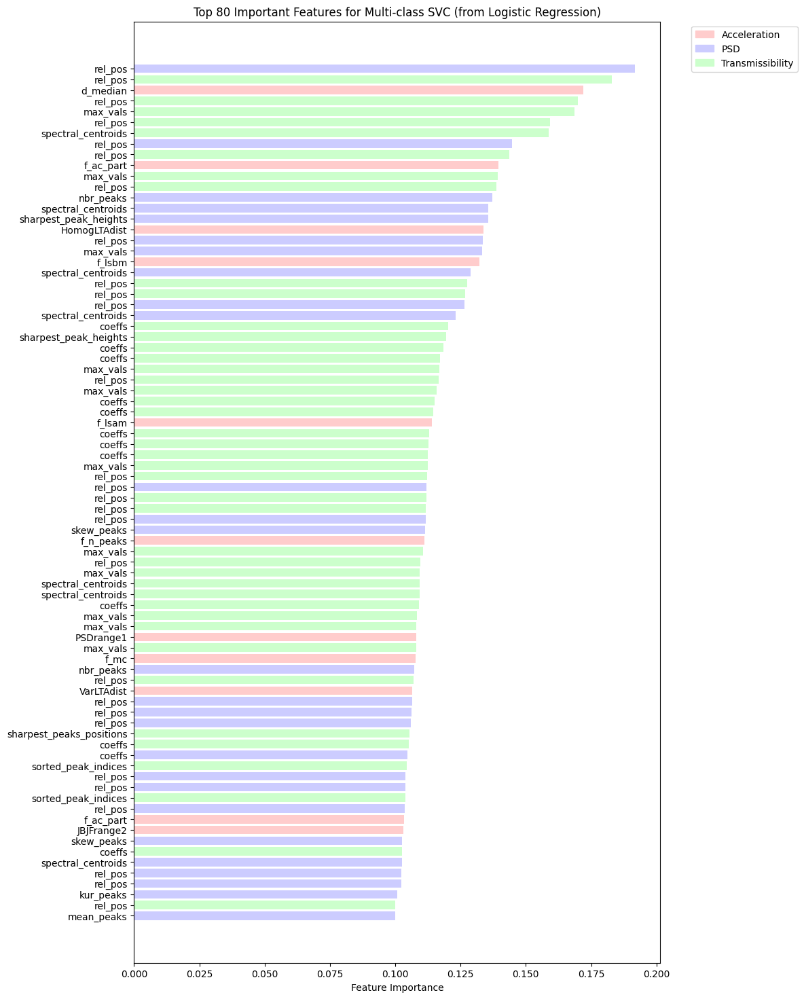

In [45]:
log_reg = LogisticRegression(C = 0.2) # logistic regression depends on the statistical distribution of the data, rather than the geometry like SVC, making it a better candidate for feature importance rather than SVC
log_reg.fit(X_train, labels_train)
sorted_feature_indices = np.argsort(np.max(log_reg.coef_, axis = 0))[::-1] # get the indices of the most important features in descending order. np.max was found to have better predictive performance compared to np.mean and np.median and np.min

plot_ranking(sorted_feature_indices, np.max(log_reg.coef_, axis = 0), feature_labels, 80, 'Multi-class SVC (from Logistic Regression)', [10, 18]) # 80 is where the elbow is located

### KNN - Binary Classification

In [47]:
from skrebate import ReliefF
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split, GridSearchCV
features_to_keep = [5, 10, 20,  40, 80, 160, 300]
neighbors = [2, 4, 8, 16]
scores_prog_knn_bin = [0]*len(features_to_keep)

weights = None
y = binarize(labels_train)
for pca_count in [3, 7, 14, 28]:
    for neighbor_count in neighbors:
        for idx, feat_cnt in enumerate(features_to_keep):

            if feat_cnt < pca_count: # if the features to keep from pca are more than features from relief, SKIP
                continue

            # feature selection
            fs = ReliefF(n_neighbors=neighbor_count, n_features_to_select=feat_cnt)
            fs.fit(X_train, y)
            X_train_relief = fs.transform(X_train)

            # dimensionality reduction (to stabilize KNN and avoid dimensionality curse)
            pca = PCA(n_components=pca_count, svd_solver = 'auto') 
            X_train_pca = pca.fit_transform(X_train_relief)

            # hyperparameters to tune
            param_grid = {
                'n_neighbors': [1, 2, 3, 5, 11, 15, 21, 31, 41, 51],
                'p': [1, 2] # 1 = manhattan, 2 = euclidean
            }

            grid_search = GridSearchCV(KNeighborsClassifier(), param_grid, cv=5, n_jobs=-1, scoring='accuracy')
            grid_search.fit(X_train_pca, y)

            scores_prog_knn_bin[idx] = max(scores_prog_knn_bin[idx], grid_search.best_score_)
            if feat_cnt == 20 and pca_count == 7 and neighbor_count == 16:
                weights = fs.feature_importances_
                
            print(f"For feature count {feat_cnt} and pca {pca_count} and neighbor count {neighbor_count} the score is {grid_search.best_score_} and param is {grid_search.best_params_}") # optimal is 20, 7, and 16

For feature count 5 and pca 3 and neighbor count 2 the score is 0.9210499490316005 and param is {'n_neighbors': 11, 'p': 1}
For feature count 10 and pca 3 and neighbor count 2 the score is 0.9155283724091063 and param is {'n_neighbors': 51, 'p': 2}
For feature count 20 and pca 3 and neighbor count 2 the score is 0.9118416581719334 and param is {'n_neighbors': 5, 'p': 2}
For feature count 40 and pca 3 and neighbor count 2 the score is 0.9044512402310566 and param is {'n_neighbors': 3, 'p': 1}
For feature count 80 and pca 3 and neighbor count 2 the score is 0.8714407067618076 and param is {'n_neighbors': 2, 'p': 2}
For feature count 160 and pca 3 and neighbor count 2 the score is 0.8969928644240571 and param is {'n_neighbors': 11, 'p': 2}
For feature count 300 and pca 3 and neighbor count 2 the score is 0.9263506625891946 and param is {'n_neighbors': 21, 'p': 1}
For feature count 5 and pca 3 and neighbor count 4 the score is 0.7776588515120625 and param is {'n_neighbors': 2, 'p': 2}
For 

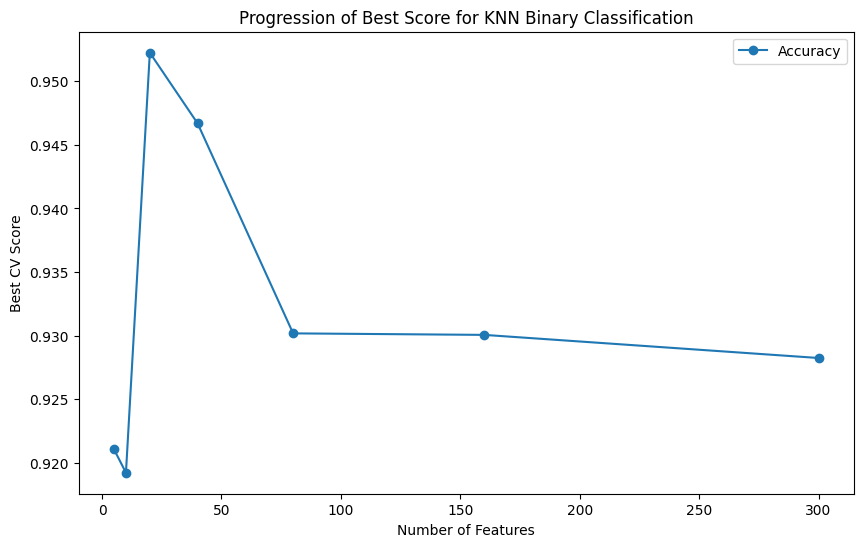

In [48]:
plt.figure(figsize=(10,6))
plt.plot(features_to_keep, scores_prog_knn_bin, '-o', label='Accuracy')
plt.xlabel('Number of Features')
plt.ylabel('Best CV Score')
plt.title('Progression of Best Score for KNN Binary Classification') # the peak occurred at 200 with 83% accuracy, but for the sake of methodolody we will keep this graph wihtout a notch at 200 to remain consistent with the other graphs 
plt.legend()
plt.show()

In [49]:
list(zip(features_to_keep, scores_prog_knn_bin))

[(5, 0.9210499490316005),
 (10, 0.9192150866462793),
 (20, 0.9522426095820592),
 (40, 0.9466870540265037),
 (80, 0.9301732925586137),
 (160, 0.9300543662928984),
 (300, 0.9282364933741081)]

In [50]:
np.argsort(weights)[::-1][0:300]

array([821, 747, 303, 673, 191, 732, 189, 895, 447, 373, 374, 670, 701,
       239, 731, 700, 699, 582, 698, 508, 608, 534, 237, 754, 659, 375,
       683, 682, 756, 302, 738, 234, 811, 819, 311, 535, 758, 702, 458,
       882, 830, 703, 883, 310, 780, 235, 781, 609, 597, 704, 782, 783,
       903, 743, 705, 304, 186, 463, 384, 828, 674, 601, 820, 905, 805,
       598,  71,  51, 527, 387, 516, 386,  92, 829,  94, 428, 418, 896,
       812, 187, 746, 419, 301, 420, 885, 328, 421, 329, 330, 681, 806,
       902, 624, 625, 590, 611, 279,  74, 627, 626, 331, 281, 299, 850,
       833,  52, 314, 831,  50, 434, 904, 444, 775, 713, 851, 595, 521,
       280, 774, 503, 852, 577, 773,  26, 358, 853, 712,  46,  44, 711,
       532, 275, 809, 772, 405, 122, 404, 402, 403, 524, 416, 254, 415,
       436, 255, 414,   3,  23, 376, 256, 257, 710, 238, 606, 322, 448,
       484, 417, 506, 890, 236, 740, 485,   2, 487,  31, 486, 223, 739,
       461, 879, 190, 175, 320, 289, 438, 748, 409, 138, 579, 64

(544, 2)


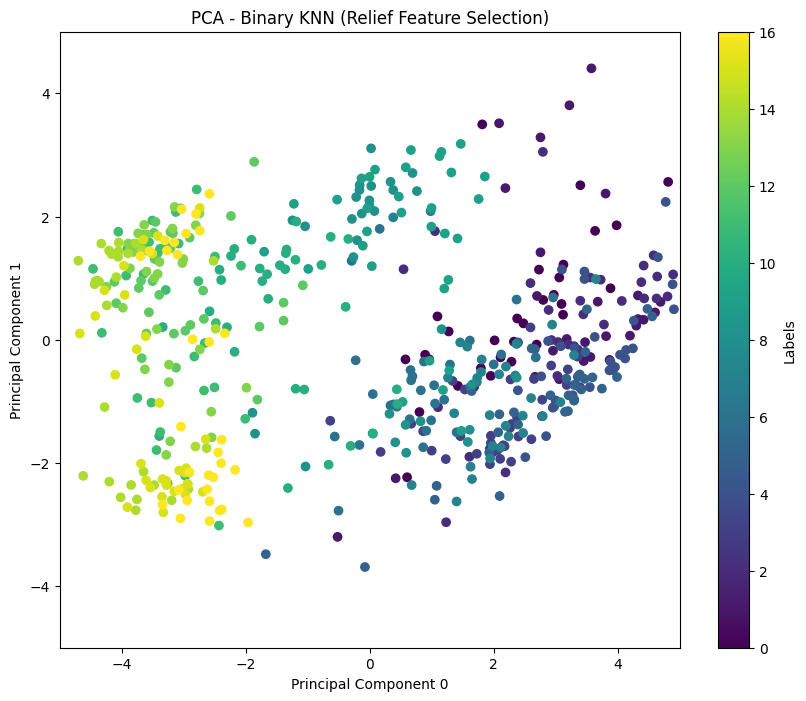

In [68]:
pca_plot(np.array([821, 747, 303, 673, 191, 732, 189, 895, 447, 373, 374, 670, 701, 239, 731, 700, 699, 582]), "PCA - Binary KNN (Relief Feature Selection)")

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


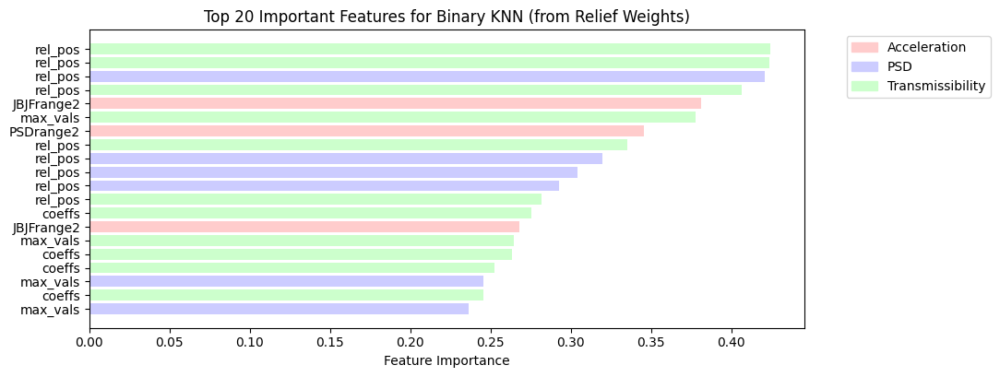

In [60]:
sorted_feature_indices = np.argsort(weights)[::-1] # get the indices of the most important features in descending order. np.max was found to have better predictive performance compared to np.mean and np.median and np.min

plot_ranking(sorted_feature_indices, weights, feature_labels, 20, 'Binary KNN (from Relief Weights)', [10, 4.2]) # 80 is where the elbow is located

In [260]:
# This time using logistic regression for feature importance

features_to_keep = [5, 10, 20, 40, 79, 160, 300]
neighbors = [2, 4, 8, 16]
scores_prog_knn_bin_log = [0]*len(features_to_keep)

weights = None
y = binarize(labels_train)

log_reg = LogisticRegression(C = 12.5) 
y = binarize(labels_train)
log_reg.fit(X_train, y)
sorted_feature_indices = np.argsort(log_reg.coef_[0])[::-1] # get the indices of the most important features in descending order

for pca_count in [2, 3, 4, 7, 14, 28]:
    for idx, feat_cnt in enumerate(features_to_keep):

        if feat_cnt < pca_count: # if the features to keep from pca are more than features from relief, SKIP
            continue

        # dimensionality reduction (to stabilize KNN and avoid dimensionality curse)
        pca = PCA(n_components=pca_count, svd_solver = 'auto') 
        indices = sorted_feature_indices[:feat_cnt]
        X_train_pca = pca.fit_transform(X_train[:, indices])

        # hyperparameters to tune
        param_grid = {
            'n_neighbors': [1, 2, 3, 5, 11, 15, 21, 31, 41, 51],
            'p': [1, 2] # 1 = manhattan, 2 = euclidean
        }

        grid_search = GridSearchCV(KNeighborsClassifier(), param_grid, cv=5, n_jobs=-1, scoring='accuracy')
        grid_search.fit(X_train_pca, y)

        scores_prog_knn_bin_log[idx] = max(scores_prog_knn_bin_log[idx], grid_search.best_score_)
            
        print(f"For feature count {feat_cnt} and pca {pca_count} the score is {grid_search.best_score_} and param is {grid_search.best_params_}") # optimal is 20, 7, and 16

For feature count 5 and pca 2 the score is 0.8325688073394495 and param is {'n_neighbors': 11, 'p': 1}
For feature count 10 and pca 2 the score is 0.780971797485559 and param is {'n_neighbors': 41, 'p': 2}
For feature count 20 and pca 2 the score is 0.865681277607883 and param is {'n_neighbors': 15, 'p': 2}
For feature count 40 and pca 2 the score is 0.9539415562351342 and param is {'n_neighbors': 31, 'p': 2}
For feature count 79 and pca 2 the score is 0.9668365613319742 and param is {'n_neighbors': 31, 'p': 2}
For feature count 160 and pca 2 the score is 0.9447332653754671 and param is {'n_neighbors': 5, 'p': 1}
For feature count 300 and pca 2 the score is 0.7828916072035339 and param is {'n_neighbors': 41, 'p': 2}
For feature count 5 and pca 3 the score is 0.9045361875637103 and param is {'n_neighbors': 31, 'p': 2}
For feature count 10 and pca 3 the score is 0.8326027862725109 and param is {'n_neighbors': 11, 'p': 1}
For feature count 20 and pca 3 the score is 0.9007985049269454 and 

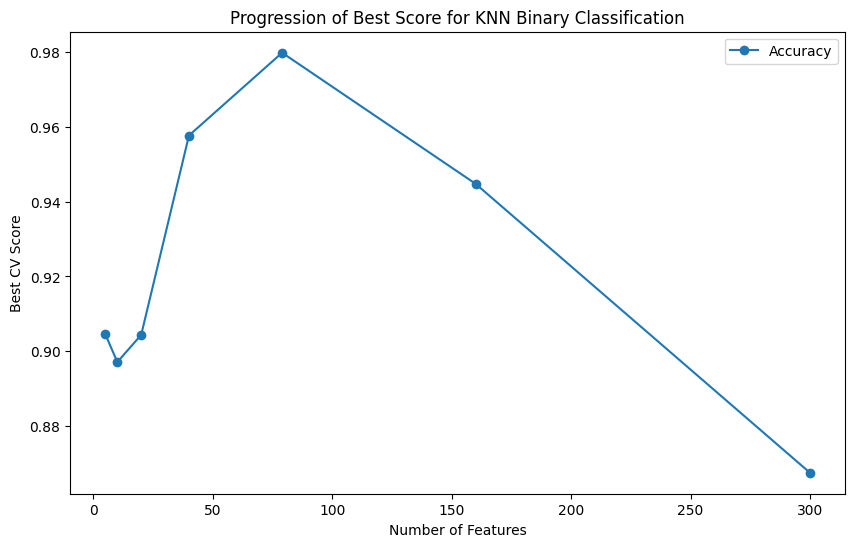

In [261]:
plt.figure(figsize=(10,6))
plt.plot(features_to_keep, scores_prog_knn_bin_log, '-o', label='Accuracy')
plt.xlabel('Number of Features')
plt.ylabel('Best CV Score')
plt.title('Progression of Best Score for KNN Binary Classification') # the peak occurred at 200 with 83% accuracy, but for the sake of methodolody we will keep this graph wihtout a notch at 200 to remain consistent with the other graphs 
plt.legend()
plt.show()

(544, 2)


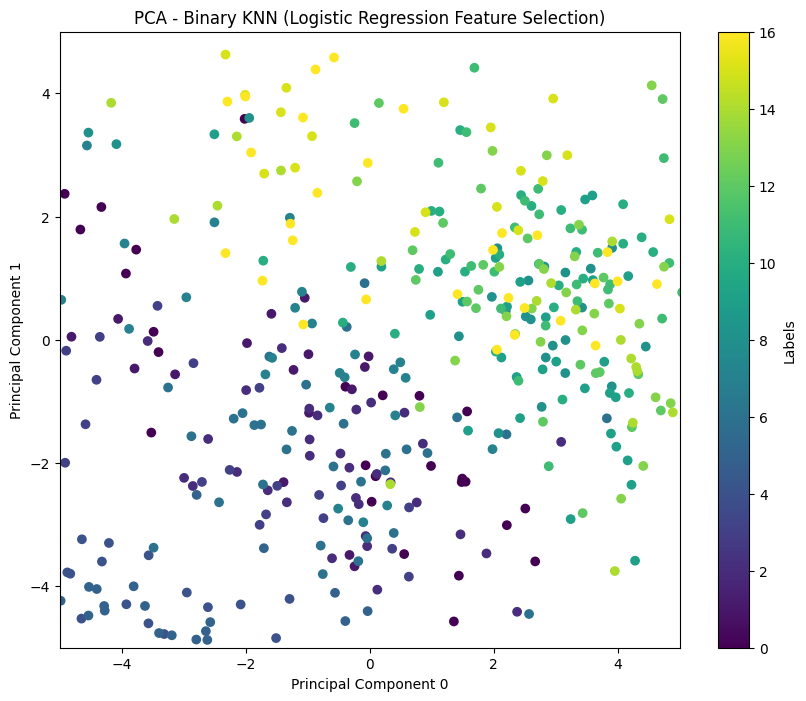

In [67]:
log_reg = LogisticRegression(C = 12.5) 
y = binarize(labels_train)
log_reg.fit(X_train, y)
sorted_feature_indices = np.argsort(log_reg.coef_[0])[::-1]
pca_plot(sorted_feature_indices[:79], "PCA - Binary KNN (Logistic Regression Feature Selection)")

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


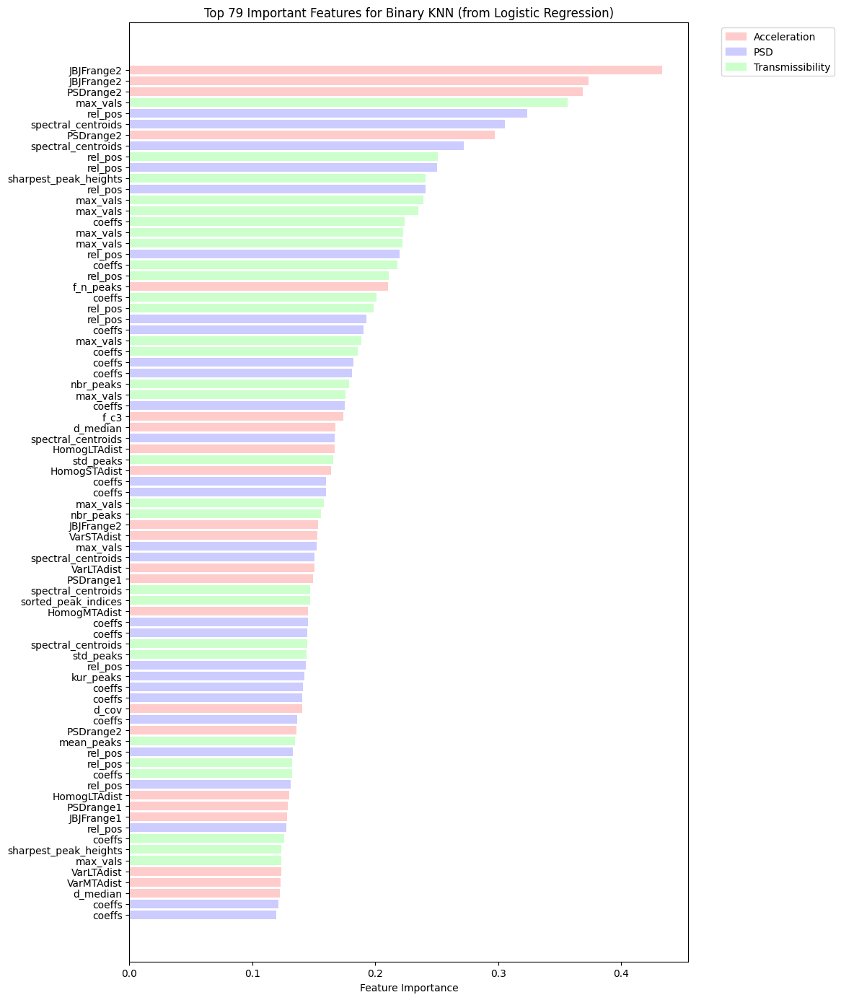

In [65]:
log_reg = LogisticRegression(C = 12.5) 
y = binarize(labels_train)
log_reg.fit(X_train, y)
sorted_feature_indices = np.argsort(log_reg.coef_[0])[::-1] # get the indices of the most important features in descending order

plot_ranking(sorted_feature_indices, log_reg.coef_[0], feature_labels, 79, 'Binary KNN (from Logistic Regression)', [10, 16.9]) # 80 is where the elbow is located

### KNN - 17-Class Classification

In [4]:
# TODO: redo this part and above using sklearn-relief
import numpy as np
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.decomposition import PCA
import os

root_folder = "C:/Users/amroa/Documents/thesis"
X_train = np.load(os.path.join(root_folder, "X_train.npy"))
labels_train = np.load(os.path.join(root_folder, "labels_train.npy"))

In [8]:
from skrebate import ReliefF
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split, GridSearchCV
features_to_keep = [5, 10, 20,  40, 80, 160, 300]
neighbors = [2, 4, 8, 16]
scores_prog_knn_multi = [0]*len(features_to_keep)
weights_relief_multi = None

y = binarize(labels_train)
for pca_count in [21, 28, 35]:
    for neighbor_count in neighbors:
        for idx, feat_cnt in enumerate(features_to_keep):

            if feat_cnt < pca_count: # if the features to keep from pca are more than features from relief, SKIP
                continue

            # feature selection
            fs = ReliefF(n_neighbors=neighbor_count, n_features_to_select=feat_cnt)
            fs.fit(X_train, labels_train)
            X_train_relief = fs.transform(X_train)

            # dimensionality reduction (to stabilize KNN and avoid dimensionality curse)
            pca = PCA(n_components=pca_count, svd_solver = 'auto') 
            X_train_pca = pca.fit_transform(X_train_relief)

            # hyperparameters to tune
            param_grid = {
                'n_neighbors': [1, 2, 3, 5, 11, 15, 21, 31, 41, 51],
                'p': [1, 2] # 1 = manhattan, 2 = euclidean
            }

            grid_search = GridSearchCV(KNeighborsClassifier(), param_grid, cv=5, n_jobs=-1, scoring='accuracy')
            grid_search.fit(X_train_pca, labels_train)
            
            if feat_cnt == 40: 
                weights_relief_multi = fs.feature_importances_

            scores_prog_knn_multi[idx] = max(scores_prog_knn_multi[idx], grid_search.best_score_)
                
            print(f"For feature count {feat_cnt} and pca {pca_count} and neighbor count {neighbor_count} the score is {grid_search.best_score_} and param is {grid_search.best_params_}") # optimal is 20, 7, and 16

For feature count 40 and pca 21 and neighbor count 2 the score is 0.6359836901121305 and param is {'n_neighbors': 1, 'p': 2}
For feature count 80 and pca 21 and neighbor count 2 the score is 0.6524464831804282 and param is {'n_neighbors': 5, 'p': 1}
For feature count 160 and pca 21 and neighbor count 2 the score is 0.6231566428814135 and param is {'n_neighbors': 3, 'p': 2}
For feature count 300 and pca 21 and neighbor count 2 the score is 0.5845735643900781 and param is {'n_neighbors': 2, 'p': 1}
For feature count 40 and pca 21 and neighbor count 4 the score is 0.6451410125722052 and param is {'n_neighbors': 5, 'p': 2}
For feature count 80 and pca 21 and neighbor count 4 the score is 0.6580360176690453 and param is {'n_neighbors': 3, 'p': 2}
For feature count 160 and pca 21 and neighbor count 4 the score is 0.6544002718314645 and param is {'n_neighbors': 3, 'p': 2}
For feature count 300 and pca 21 and neighbor count 4 the score is 0.6102446483180428 and param is {'n_neighbors': 5, 'p':

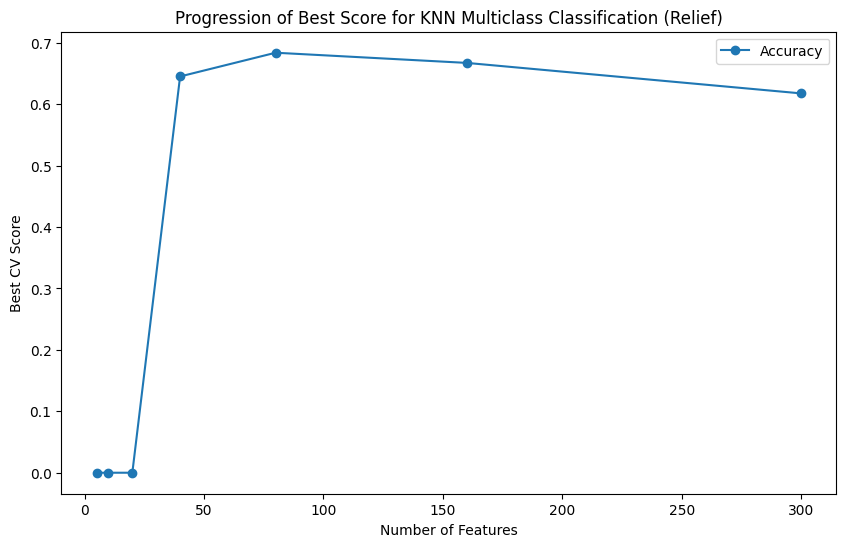

In [7]:
plt.figure(figsize=(10,6))
plt.plot(features_to_keep, scores_prog_knn_multi, '-o', label='Accuracy')
plt.xlabel('Number of Features')
plt.ylabel('Best CV Score')
plt.title('Progression of Best Score for KNN Multiclass Classification (Relief)') # the peak occurred at 200 with 83% accuracy, but for the sake of methodolody we will keep this graph wihtout a notch at 200 to remain consistent with the other graphs 
plt.legend()
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


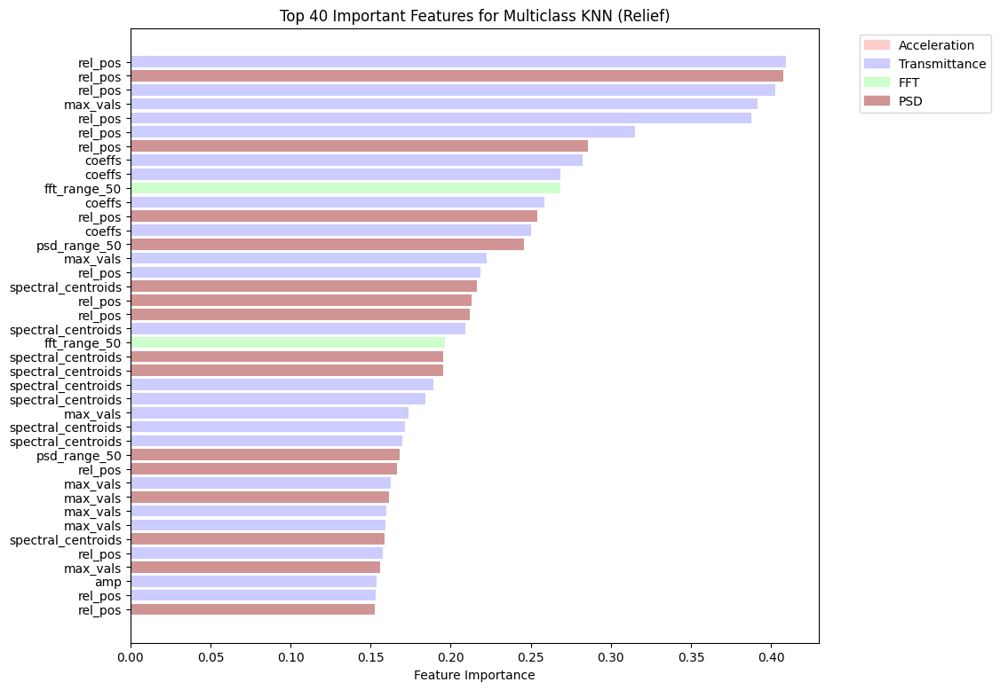

In [21]:
sorted_feature_indices = np.argsort(weights_relief_multi)[::-1] # get the indices of the most important features in descending order. np.max was found to have better predictive performance compared to np.mean and np.median and np.min
plot_ranking(sorted_feature_indices, weights_relief_multi, feature_labels, 40, 'Multiclass KNN (Relief)', [10, 9]) # 80 is where the elbow is located

In [67]:
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from predict import binarize

y = binarize(labels_train)
subset_indices =[189, 239, 303,  811,   899, 780,  375,  700,  782,
    373, 601,  386,   883,  328,  734,  833,  330, 753, 254, 611, 
    289,  95,   415,  379, 681,  93,  417, 713, 324,   92,  903,
   35,  711]
param_grid = {
        'C': [0.01, 0.1, 0.5, 20, 100]
}
len_si = len(subset_indices)
highest_score = -1
save_idx = []
for feature_1 in range(len_si):
    for feature_2 in range(feature_1+1, len_si):
        for feature_3 in range(feature_2+1, len_si):
            idxf1 = subset_indices[feature_1]
            idxf2 = subset_indices[feature_2]
            idxf3 = subset_indices[feature_3]
            grid_search = GridSearchCV(LogisticRegression(), param_grid, cv=5, n_jobs=-1, scoring='accuracy')
            grid_search.fit(X_train[:, np.array([idxf1, idxf2, idxf3])], y)
            if highest_score < grid_search.best_score_:
                highest_score = grid_search.best_score_
                save_idx = [idxf1, idxf2, idxf3]
            print(f"For {idxf1}, {idxf2}, {idxf3} the score is {grid_search.best_score_} and param is {grid_search.best_params_}")


For 189, 239, 303 the score is 0.8787291879035 and param is {'C': 20}
For 189, 239, 811 the score is 0.8803771661569826 and param is {'C': 0.5}
For 189, 239, 899 the score is 0.7937818552497452 and param is {'C': 20}
For 189, 239, 780 the score is 0.845293917770982 and param is {'C': 20}
For 189, 239, 375 the score is 0.8194869181107715 and param is {'C': 0.01}
For 189, 239, 700 the score is 0.8823139653414884 and param is {'C': 0.5}
For 189, 239, 782 the score is 0.8416072035338089 and param is {'C': 20}
For 189, 239, 373 the score is 0.7789500509683995 and param is {'C': 0.01}
For 189, 239, 601 the score is 0.8029901461094122 and param is {'C': 20}
For 189, 239, 386 the score is 0.7864593951749915 and param is {'C': 0.5}
For 189, 239, 883 the score is 0.8307339449541284 and param is {'C': 0.1}
For 189, 239, 328 the score is 0.8453448861705744 and param is {'C': 20}
For 189, 239, 734 the score is 0.7901291199456336 and param is {'C': 0.5}
For 189, 239, 833 the score is 0.7864593951749

In [69]:
save_idx

[189, 780, 700]

In [136]:
grid_search = GridSearchCV(LogisticRegression(), param_grid, cv=4, n_jobs=-1, scoring='accuracy')
grid_search.fit(X_train[:, np.array([ 191, 673,  328, 374])], y)
print(f"For the score is {grid_search.best_score_} and param is {grid_search.best_params_}")

grid_search = GridSearchCV(LogisticRegression(), param_grid, cv=4, n_jobs=-1, scoring='accuracy')
grid_search.fit(X_train[:, np.array([189, 780, 700])], y)
print(f"For the score is {grid_search.best_score_} and param is {grid_search.best_params_}")

For the score is 0.9301470588235294 and param is {'C': 0.01}
For the score is 0.9172794117647058 and param is {'C': 0.01}


In [ ]:
[191, 189, 239, 303, 888, 237, 608, 387, 812, 811, 899, 886, 780, 375, 372, 885, 700, 782,
 373, 601, 698, 386, 328,  60, 883, 734, 875, 833, 330, 404, 402, 753, 534 ,256, 254, 611,
  37, 744, 289,  95, 346,  34, 344, 415, 379, 681, 686,  93, 417, 713, 324,  92,  36, 903,
  35, 711]

In [412]:
subset_indices =[189, 239, 303,  811,   899, 780,  375,  700,  782,
    373, 601,  386,   883,  328,  734,  833,  330, 753, 254, 611, 
    289,  95,   415,  379, 681,  93,  417, 713, 324,   92,  903,
   35,  711]
print(len(subset_indices))

33


In [489]:
el=[189, 239, 303,  811,   899, 780,  375,  700,  782,
    373, 601,  386,   883,  328,  734,  833,  330, 753, 254, 611, 
    289,  95,   415,  379, 681,  93,  417, 713, 324,   92,  903,
   35,  711] 
print(el[19])

611


In [6]:
feature_labels[191], feature_labels[ 374], feature_labels[673], feature_labels[328]

('fft_range_50', 'rel_pos', 'rel_pos', 'coeffs')